In [1]:
#| echo: false

# code for corpus extraction

# libraries imported

from bs4 import BeautifulSoup
import future
import pandas as pd
import csv
import itertools
import uuid
import requests
import re
from IPython.display import display, Markdown
from tqdm import tqdm
tqdm.pandas()
import matplotlib.pyplot as plt

# link for digitised text of Natural History_book1-11
url1 = "https://topostext.org/work/148"

# link for digitised text of Natural History_book12-37
url2 = "https://topostext.org/work/153"

# function for text with geographical name annotation scraping

def toposgeotext(url):
    response = requests.get(url)
    if response.status_code != 200:
        raise FileNotFoundError("Failed to retrieve HTML content: " + url)

    data = []
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", {"class": "place"})

    for link in links:
        Place_Name = link.contents[0]  # Place name
        ToposText_ID = link.get('about')  # ToposText ID
        Lat = link.get('lat')
        Long = link.get('long')
        Parent = link.find_parent("p")
        Text = Parent.text  # Extract related text
        Reference = Parent.get("id")  # Indicate book, chapter, paragraph

        # Separate the information in Text using the regular expression pattern
        match = re.search(r'§\s+(\d+\.\d+\.\d*)\s+(.*)$', Text)
        if match:
            Chapternparagraph = match.group(1)  # Extract the reference from the pattern
            Text = match.group(2)  # Extract the remaining text from the pattern
            
            # Extract the book, chapter, and paragraph components
            book, chapter, paragraph = Chapternparagraph.split('.')
            
            UUID4 = uuid.uuid4()  # Create a unique ID

            data.append({
                'UUID4': UUID4,
                'ToposText_ID': ToposText_ID,
                'Place_Name': Place_Name,
                'Reference': Reference,
                'Lat': Lat,
                'Long': Long,
                'Book': book,  # Add the book component to the DataFrame
                'Chapter': chapter,  # Add the chapter component to the DataFrame
                'Paragraph': paragraph,  # Add the paragraph component to the DataFrame
                'Text': Text
            })

    df = pd.DataFrame(data)
    # Convert data types to numeric
    df['Book'] = pd.to_numeric(df['Book'], errors='coerce')
    df['Chapter'] = pd.to_numeric(df['Chapter'], errors='coerce')
    df['Paragraph'] = pd.to_numeric(df['Paragraph'], errors='coerce')
    return df

# construct the dataframe for two parts of the digitised text with geographical annotations with the toposgeotext function
geodf1 = toposgeotext(url1)
geodf2 = toposgeotext(url2)

geotext_whole = pd.concat([geodf1, geodf2], ignore_index=True)

geotext_whole.to_csv('geotext_whole.csv')

# function for scraping entire text from ToposText with given html

def topostext(url):
    response = requests.get(url)
    if response.status_code != 200:
        raise FileNotFoundError("Failed to retrieve HTML content: " + url)
    
    data = []
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("p")  # Find all <p> tags instead of filtering by class

    for link in links:
        match = re.search(r'§\s+(\d+\.\d+\.\d*)\s+(.*)$', link.text)
        if match:
            Chapternparagraph = match.group(1)  # Extract the reference from the pattern
            # Extract the book, chapter, and paragraph components
            book, chapter, paragraph = Chapternparagraph.split('.')
            Text = match.group(2)  # Extract the text from the pattern
            Reference = link.get("id")  # Indicate book, chapter, paragraph
            UUID4 = uuid.uuid4()  # Create a unique ID

            data.append({
                'UUID4': UUID4,
                'Reference': Reference,
                'Book': book,  # Add the book component to the DataFrame
                'Chapter': chapter,  # Add the chapter component to the DataFrame
                'Paragraph': paragraph,  # Add the paragraph component to the DataFrame     
                'Text': Text
            })

    df = pd.DataFrame(data)
    # Convert data types to numeric
    df['Book'] = pd.to_numeric(df['Book'], errors='coerce')
    df['Chapter'] = pd.to_numeric(df['Chapter'], errors='coerce')
    df['Paragraph'] = pd.to_numeric(df['Paragraph'], errors='coerce')
    return df

# construct the dataframe for two parts of the digitised text with the topostext function
df1 = topostext(url1)
df2 = topostext(url2)

# combine the two parts of scraped text
wholebook = pd.concat([df1, df2], ignore_index=True)

# store the scraped text into csv file
wholebook.to_csv('wholebooktext.csv')

\clearpage
\pagestyle{plain}
\pagenumbering{arabic}  
\setcounter{page}{1} 

## Introduction {#sec-introduction}

### *Natural History* and its complexity
Pliny the Elder's *Natural History* is widely recognized as the earliest encyclopedia in the world, manifesting a pioneering effort in comprehensively cataloguing the vast array of human knowledge from that era. 

The work is thematically divided into 37 books, covering a diverse range of subjects including astronomy, geography, zoology, botany, medicine, and more. Pliny meticulously consulted a wide range of Greek and Roman references, totalling approximately 2,000 volumes^[*Natural History* 1.5.1 (<a href="https://topostext.org/work/148" target="_blank">https://topostext.org/work/148</a>)], and interwove his own literary interpretation or comments to the narratives.

Despite the carefully designed knowledge-ordering framework [@lao2016], scholars have observed a paradoxical complexity in *Natural History*, evident in its linguistic style, narrative approach, and use of references. The work compiles variant toponyms from Greek and Latin, includes digressions in descriptions [@roller2022], and exhibits changes in vocabularies and sentence structures [@pinkster2005]. However, it is precisely this complexity that makes the work more fascinating and not only a valuable source of the knowledge and worldview of the ancient world, but also a gateway into Pliny's conceptualization, imagination, and even the prevailing imperial ideology of that time.

The complexity and interconnectivity of the general structure of *Natural History* are further highlighted in different aspects by refreshing approaches. For the content organisation, @healy1999 advocated Pliny's original contribution in revealing the technology and science engagement of the Rome Empire. Taking the historical, political and linguistic context into consideration, he found that in addition to providing informative descriptions of natural phenomena and scientific experiments, Pliny also developed the scientific language in Latin through his work. Moreover, @naas2002 discussed how Pliny formulated the diverse materials into his encyclopaedic structure, revealing the work's multifaceted nature as an epistemological, ideological, and moral project. Analysing Pliny's employment of the historical exemplum in the work, @schultze2011 argued how that literary device directed and teased the readers as well as established a profound connection between human beings and the entire spectrum of nature in *Natural History*.

In addition to the contextual and referential analyses of *Natural History*, @rydberg-cox2021 employed network analysis techniques, applying various metrics to illustrate the connections between Pliny's sources and the topics discussed in the work. Furthermore, @fantoli2022 conducted a comparative examination of book 2 of *Natural History* and book 7 of Seneca’s *Natural Questions*, both focused on astronomy as part of the Latin classics about nature. Statistical methods were applied to investigate variations in their discursive distribution, effectively identifying Pliny's distinctive stylistic attributes. Moreover, the encyclopaedic authorial intent evident in *Natural History* is validated through correspondence and tree analysis. These studies collectively showcase how distant reading methodologies offer novel insights into our understanding of ancient treatises.

### Spatial perspective in *Natural History*
As pointed out by @beagon2011, differentiating from his predecessors, Pliny showed a "terrestrial curiosity" in *Natural History*, emphasising recognition of the physical, material world. In this regard, the vision of geography plays a pivotal role in distributing information, knowledge, and events throughout *Natural History*. 

Drawing from the long-established topographical and ethnographic traditions, Pliny seamlessly connects volumes dedicated to geography (books 3-6) with broader elements, activities, and cultural, historical, and societal contexts[@roller2022], exemplified in his portrayal of exotic plants, communities' habitats, imperial expeditions, and trade products. In other words, geographical names that occurred in each book of *Natural History* served as signposts guiding readers through diverse lands, shedding light on how Pliny and his contemporaries perceived and conceptualized the world around them.

A normalized frequency of place name occurrence in the work is calculated as the ratio of counts of the occurrences of place names in each book to the word lengths of the book (@tbl-place_book_distribution). The bar chart (@fig-place_distribution) depicts the comparison of the distribution of place names in the books of *Natural History*. The observation aligns with the content structure of *Natural History*, that books 3-6 centred around the themes of "geography and ethnography", contain the most mentions of location names, and place names are also frequently mentioned in books about agriculture and horticulture (book 12-14), aquatic life (book 31), and mining and mineralogy (book 34-37).

In [2]:
#| label: tbl-place_book_distribution
#| tbl-cap: Normalized distribution of place names in *Natural History*
#| df-print: tibble

# Group the items by "Book" and calculate the total word length

book_word_lengths = wholebook.groupby('Book')['Text'].apply(lambda x: x.str.split().str.len().sum()).reset_index()
book_word_lengths.columns = ['Book', 'Total_length']
# Set the "Book" column as the index
book_word_lengths.set_index('Book', inplace=True)

place_counts = geotext_whole['Book'].value_counts().reset_index()
place_counts.columns = ['Book', 'Place_count']
place_counts.set_index('Book', inplace=True)

place_distribution = book_word_lengths.merge(place_counts, on='Book')
place_distribution['Place_freq'] = place_distribution['Place_count']/place_distribution['Total_length']

pd.options.display.width = 30
place_distribution

,Total_length,Place_count,Place_freq
Book,,,
1,2778,1,0.000360
2,30570,406,0.013281
3,18037,1007,0.055830
4,15434,1309,0.084813
5,18872,1112,0.058923
6,27891,1012,0.036284
7,21204,225,0.010611
8,24176,185,0.007652
9,19197,140,0.007293


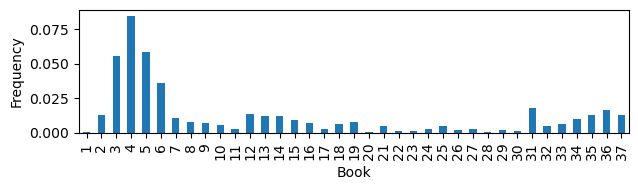

In [4]:
#| label: fig-place_distribution
#| fig-cap: Normalized distribution of place names in *Natural History*

fig, ax = plt.subplots(figsize=(8, 2))  # Adjust the figsize to increase the plot size

place_distribution['Place_freq'].plot.bar(ax=ax)
plt.xlabel('Book')
plt.ylabel('Frequency')

# Adjust the plot alignment
plt.tight_layout(rect=[0, 0, 0.8, 1])  # Change the rect values to adjust the alignment

plt.show()

### Text source for the study 
*Natural History* is originally in Latin. For the purpose of this study, an English translation by Henry T. Riley (1816-1878) and John Bostock (1773-1846), first published in 1855, is utilized. The translated text is obtained in a digitised version from the [TOPOSText project](https://topostext.org/the-project), having been sourced from the Perseus Project and governed by a Creative Commons Attribution-Share-Alike 3.0 U.S. License.

Annotations of proper names, place names and their corresponding coordinates are available together with the text of *Natural History* ([Book1-11](https://topostext.org/work/148), [Book12-37](https://topostext.org/work/153)) on [TOPOSText project](https://topostext.org/the-project). This invaluable resource allows for creating a dataset that includes both the textual contents and geographical annotations, which can be utilized to investigate the distribution of place names in the entire work and examine the frequencies and patterns of geography-related content.

The extension of the extracted corpora and the workflow of the extraction will be further explained in the Methodology chapter (@sec-methodology).

\newpage

## Research Question {#sec-research_question}

### Prominent mentioned places in *Natural History*

In [32]:
place_number = len(geotext_whole['ToposText_ID'].unique().tolist())

display(Markdown("""
Based on the geographical annotations in *Natural History* provided by the TOPOSText,
there are {place_number} unique places mentioned in *Natural History*.
""".format(place_number = place_number)))


Based on the geographical annotations in *Natural History* provided by the TOPOSText,
there are 2052 unique places mentioned in *Natural History*.


The top 20 most frequently mentioned place names (as 1% of the total) in *Natural History* is shown in @tbl-topplace.

In [34]:
#| label: tbl-topplace
#| tbl-cap: Top 20 mentioned place names in *Natural History*
#| df-print: tibble

## sort the top 1% places referred in descending order

place = geotext_whole.groupby('ToposText_ID')[['Place_Name','Lat','Long']].value_counts().reset_index(name='Count')
sorted_place = place.sort_values(by='Count', ascending=False)
top_count = sorted_place.iloc[19]['Count']
topplace = sorted_place[sorted_place['Count'] >= top_count]
topplace

,ToposText_ID,Place_Name,Lat,Long,Count
1687,https://topostext.org/place/406163RIta,Italy,40.6000,16.30000,292
2034,https://topostext.org/place/419125PRom,Rome,41.8910,12.48600,269
52,https://topostext.org/place/271307REgy,Egypt,27.1000,30.70000,261
82,https://topostext.org/place/300740RInd,India,30.0000,74.00000,167
57,https://topostext.org/place/280400RAra,Arabia,28.0000,40.00000,123
320,https://topostext.org/place/355390RSyr,Syria,35.5000,39.00000,109
255,https://topostext.org/place/350330RCyp,Cyprus,35.0000,33.00000,85
109,https://topostext.org/place/312301WNil,Nile,30.0918,31.23130,85
2282,https://topostext.org/place/441073LAlp,Alps,44.1420,7.34300,82
766,https://topostext.org/place/376145RSic,Sicily,37.6000,14.50000,71


The place names referenced in *Natural History* are geographically mapped, with each location marked on the map using its corresponding coordinates. A dot is assigned to represent a place, with the size and color of the dot reflecting the frequency of its mention in the work. The larger and darker the dot, the more frequently the place is referred to within the context of *Natural History*.

An intriguing observation from the output, as depicted in @fig-geonamemap_pdf, is the prominence of India, a region outside the Mediterranean, despite its high frequency of mentions.

In [35]:
#| output: false
#| label: fig-geonamemap
#| fig-cap: Place name distribution map

import folium
from branca.colormap import LinearColormap

# Create a Folium map centred on a specific location
map = folium.Map(location=[32, 53], zoom_start=3)

# Define the minimum and maximum count values for the color scale
min_count = place['Count'].min()
max_count = place['Count'].max()

# Create a color map based on the count values
color_map = LinearColormap(colors=['#FFCC00', '#FF6600'],
                           vmin=min_count,
                           vmax=max_count)

# Iterate over each row in the dataframe
for index, row in place.iterrows():
    place_name = row['Place_Name']
    count = row['Count']
    latitude = row['Lat']
    longitude = row['Long']
    
    # Get the color based on the count using the color map
    color = color_map(count)
    
    # Create a circle marker with a size based on the count and color based on the count
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=count/10,  # Adjust the size of the marker based on the count
        weight=0,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        tooltip=f'{place_name}: {count} counts'
    ).add_to(map)

# Add the color scale to the map
color_map.caption = 'Count'
color_map.add_to(map)

# Display the map
map

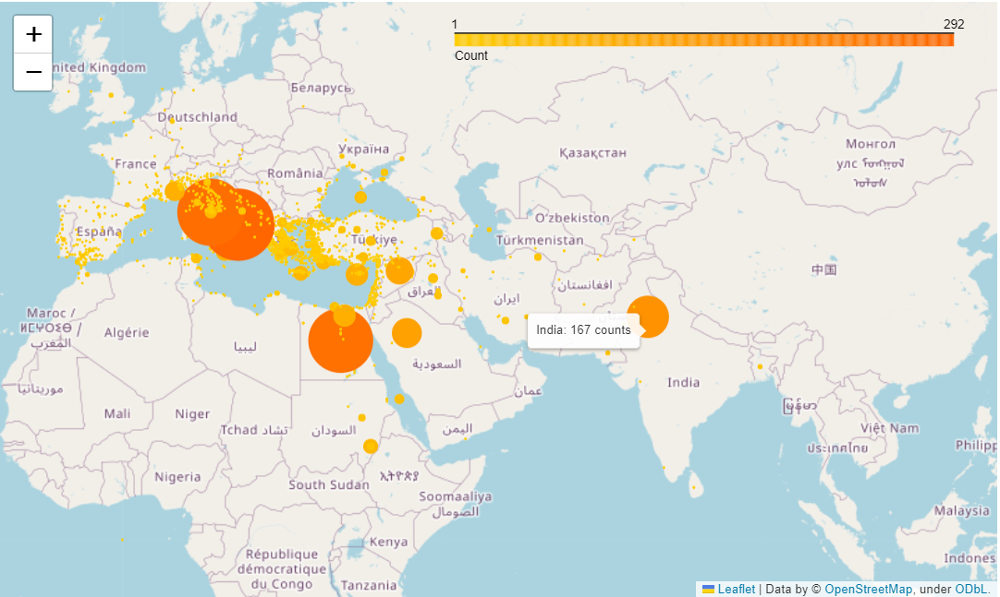

In [17]:
#| label: fig-geonamemap_pdf
#| fig-cap: Place name distribution map

from PIL import Image

# Open the images using PIL
Image.open('map_forpdf.png')

### Why India?

Geographically, India seems a distant and disconnected territory from the Roman Empire, lacking any direct aquatic or land routes with the Mediterranean region. However, the exotic curiosity Pliny attempted to integrate within his work, and the history of the Indo-roman trade relations, can be regarded as a broader context for the prominent mentioning of India in *Natural History*. 

As suggested by [@murphy2003], the *mirabilia*, encompassing accounts of extraordinary landscapes, people, plants, and animals, assumes a substantial proportion within the books of *Natural History*. Pliny's inclusion of such exotic elements not only catered to the prevailing curiosity of his Roman readers but also fostered a comparative perspective between distant locales, exemplified by his references to India, and their natural counterparts within Rome [@naas2011]. Within a research framework of Roman Imperialism, the detailed portrayal of foreign lands, such as India, holds significant importance in shaping both Pliny's and his contemporary Roman readers' perception of their place within the global landscape [@pollard2009].

In addition, *Natural History* serves as a valuable reference for tracking the Indo-Mediterranean network of exchange [@pollard2009]. Through the depiction of cities, ports, and rivers along the trade routes, the work provides substantive evidence of the flourishing trade relations between the Roman Empire and the Indian subcontinent [@neelis2011]. The extensive exemplification of diverse commodities, such as gemstones, glass, spices, textiles, plants, and wine, along with the accounts of the currency *sestertii* involved in the merchandise exchange in the work shed lights to the compelling details and social and cultural implications of this long-distance trade [@szekely2006; @pollard2009]. Furthermore, the direct criticisms regarding the high cost of the luxury items imported from India imply both the magnitude of the trade volume and Pliny's stance towards this commercial interaction [@neelis2011].

### India-related text as a case study

In light of the observations and foundational research mentioned above, the present study centres its investigation on the spatial perspective within Pliny's *Natural History*, focusing on the texts about India, seeking to delve into the discourse surrounding this region. To achieve this goal, distant reading methodologies, including statistical analysis, topic modelling, and social network analysis, are employed in the study.

The main aim of this study is to explore how India is described, and how the information about India is structured in *Natural History*, which may also contribute to a more profound comprehension of the inherent complexity and interconnectivity that permeates this monumental work.

\newpage

## Methodology {#sec-methodology}

### Workflow

The workflow for this study involves the following key stages: 

**Data Collection**:

As mentioned in the Introduction chapter (@sec-introduction), the text employed for this study is obtained from the digitised English translation (by Henry T. Riley (1816-1878) and John Bostock (1773-1846)) of Pliny's *Natural History* available on [TOPOSText project](https://topostext.org/the-project). 

The two parts of *Natural History* ([Book1-11](https://topostext.org/work/148), [Book12-37](https://topostext.org/work/153)) are scraped for their the textual contents together with the geographical annotation of the mentioned ancient places, and their book, chapter and paragraph positions with the function provided in [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) library of Python. 


**Data Preprocessing**:

The information extracted from the HTML file is structured into separate columns as [Pandas](https://pandas.pydata.org/) dataframe, a dataframe for plain text of the entire work, and a dataframe for geographical-related text in *Natural History* with the geographical annotations are generated and stored in CSV format.

After a preliminary exploration, the research focus is narrowed down to India-related text in *Natural History*. Referring to the geographical territories in the scope of ancient Greek and Roman world [@talbert2000], a dataframe for India-related text is filtered from the abovementioned dataframe for geographical-related text with the range of corresponding coordinates of Indian subcontinent in the era of *Natural History*. The flitered India-related text dataframe is also stored in CSV format.

The location names mentioned in the India-related text were checked manually for its completeness. The identified location names without annotation in TOPOSText were appended to the India-related text dataset.

Additionally, the textual contents in the datasets were preprocessed with tokenization, lemmatization and the exclusion of stop-words processes.

**Data Analysis**:

Statistical analysis is conducted in the preliminary exploration. A nomalized frequency of geographical name occurence in each book is calculated for an overview of the place name distribution in *Natural History*. The top 1% prominently mentioned place names in the entire work are sorted out with the time of their occurencies. The specific attention on India-related text as a case study is drown from this initial observation.

In the analysis of the India-related text (target corpus) in *Natural History*, three analysis methods are employed:

1. Word frequency and collocation analysis: single word frequency and bi-gram collocation of the target corpus are measured with the functions in [NLTK](https://www.nltk.org/) package for an overview of the common word patterns relating to India in *Natural History*.

2. Topic modelling: [Genism](https://radimrehurek.com/gensim/) library is used for semantic vectorization and implemetion of Latent Dirichlet Allocation (LDA) model for the topic modelling of the target corpus, and the library of [pyLDAvis](https://pyldavis.readthedocs.io/en/latest/index.htmlgenism) is utilized for an interactive visualisation. The output of this method shows the potential topics in the India-related text in *Natural History*.

3. Network analysis for named entities: Person names mentioned in the India-related text are retrieved from annotaions on TOPOSText. Person and place names occured in the target corpus are extracted as nodes together with the book numbers where it is mentioned, and the co-occurence between the nodes are counted as edges for network analysis. The output of this method is a graph showing the clusters of the nodes in the target corpus, indicating the structure of the content related to India in *Natural History*.


**Interpretation and Conclusion**:

The workflow and parameter setting of each research method are explained at the beginning of each analysis section. The results aquired from each method are interpreted with a dialouge to the broader literature and close reading of the related text.

In the Conclusion chapter (@sec-conclusions), the findings are illustrated comprehensively as a response to the research questions. And the limitations of the methods are discussed and evaluated.

### Data preparation

This section provides an overview of the data preparation process, encompassing four sub-sections: HTML scraping from TOPOSText, creation of a filtered dataset of "India-related text," completeness check and preprocessing of textual data. The tools and procedures employed in data collection and dataset generation for the study are introduced in the subsequent content.

#### HTML scraping  from TOPOSText

As previously stated, the textual contents of Pliny's *Natural History* are available on the [TOPOSText project](https://topostext.org/the-project), presented in two distinct parts: [Book 1-11](https://topostext.org/work/148), [Book 12-37](https://topostext.org/work/153), both of which are in HTML format.

To extract the relevant data, the [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) tool, a Python library renowned for parsing HTML and XML documents, was employed. 

The text in the HTML documents is organised into paragraphs, each uniquely identified by an "id" attribute that specifies its corresponding book, chapter, and paragraph number. For instance, a typical paragraph has an "id" tag as follows: 

**\<p id='urn:cts:latinLit:phi0978.phi001:3.9.7'>** 

The textual contents are retrieved with the information from these "id" attributes and structured as a reference dataset, comprising the plain text of *Natural History* divided into paragraphs, with each paragraph assigned a unique identifier, and separate columns indicating its book, chapter, and paragraph number. An illustrative example of the dataset's structure is shown as @tbl-dataset_plaintext.

In [3]:
#| df-print: tibble
#| label: tbl-dataset_plaintext
#| tbl-cap: Example for the reference dataset containing the plain text in paragraphs of *Natural History*
#pd.set_option('max_colwidth', 40)
#pd.set_option('display.expand_frame_repr', False)
pd.options.display.max_colwidth = 15
wholebook.head()

,UUID4,Reference,Book,Chapter,Paragraph,Text
0,e9e67565-bb...,urn:cts:lat...,1,1,1.0,PREFACE IN ...
1,010b853d-b8...,urn:cts:lat...,1,2,1.0,But who cou...
2,2d10e332-9c...,urn:cts:lat...,1,3,1.0,But if Luci...
3,113e0b4c-5b...,urn:cts:lat...,1,4,1.0,My own pres...
4,19115032-9f...,urn:cts:lat...,1,5,1.0,For my own ...


In [2]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def tokenize_paragraphs(texts):
    ## apply word tokenization function of NLTK module to each paragraph
    words = [word_tokenize(text, language='English') for text in texts]
    
    
    ## set list of stop words to be excluded from the tokenlist with stopwords function in NLTK
    stop_words = set(stopwords.words('English'))
    
    lemmatizer = WordNetLemmatizer()
    
    ## append words of text into a tokenlist
    tokenlistpara = []
    for paragraph in words:
        paragraph_tokens = []
        for token in paragraph:
            if token.lower() and token.lower() not in stop_words and len(token.lower()) > 2:
                ## lemmatize the tokens
                lemmatized_token = lemmatizer.lemmatize(token.lower())
                paragraph_tokens.append(lemmatized_token)
        tokenlistpara.append(paragraph_tokens)
    return tokenlistpara

In [3]:
# function for token and type counting for the given corpus

from collections import Counter
import nltk
nltk.download('punkt')
import string

def tokencounter(text):
    # Tokenize the text, including punctuation marks
    tokenlist = [word for paragraph in tokenize_paragraphs(text) for word in paragraph]
    
    token_counts = len(tokenlist)
    type_counts = len(set(tokenlist))
    
    return token_counts, type_counts

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\dawn\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [41]:
#| echo: false

totalpara = len(wholebook)
wholetoken = tokencounter(wholebook['Text'])[0]
wholetype = tokencounter(wholebook['Text'])[1]

display(Markdown("""There are a total of {totalpara} paragraphs in the English-translated version of 
*Natural History* used in this study. The extracted text contains {wholetoken} tokens and {wholetype} types after preprocessing.
This reference dataset has been saved in CSV format for record.""".format(totalpara = totalpara,wholetoken = wholetoken, wholetype = wholetype )))

There are a total of 3493 paragraphs in the English-translated version of 
*Natural History* used in this study. The extracted text contains 343096 tokens and 28606 types after preprocessing.
This reference dataset has been saved in CSV format for record.

Moreover, the geographical annotations concerning the ancient places mentioned in the text are labelled with a class attribute denoted as "place", including a URI for the location, the place name and its corresponding coordinates,  exemplified by the following HTML code snippet: 

**\<a about="https://topostext.org/place/419125LPal" class="place" lat="41.8896" long="12.4884">Palatine\</a>**

All annotations under the "place" class are extracted, and the URI, name, geographical coordinates, textual content and the book/chapter/paragraph number of each place are structured into the dataset for geographical-related text in *Natural History*. An example of this dataset is shown in @tbl-dataset_geotext for reference.

In [21]:
#| df-print: tibble
#| label: tbl-dataset_geotext
#| tbl-cap: Example for the *Natural History* geographical-related text dataset
#| fontsize: 8pt

#pd.set_option('max_colwidth', 10)
#pd.set_option('display.expand_frame_repr', False)
pd.options.display.width = 6
#pd.options.display.max_colwidth = 15
#pd.options.display.multi_sparse = False
#pd.options.display.latex.repr=True
#pd.options.display.max_colwidth = 8
geotext_whole.head()

,UUID4,ToposText_ID,Place_Name,Reference,Lat,Long,Book,Chapter,Paragraph,Text
0,bf12...,http...,Academy,urn:...,37.9920,23.7070,1,8,1.0,For ...
1,f782...,http...,Pala...,urn:...,41.8896,12.4884,2,5,1.0,For ...
2,a0f9...,http...,Esqu...,urn:...,41.8950,12.4960,2,5,1.0,For ...
3,b8d8...,http...,Capitol,urn:...,41.8933,12.4830,2,5,1.0,For ...
4,f81b...,http...,Rome,urn:...,41.8910,12.4860,2,6,3.0,Belo...


In [79]:
#| output: false

# check the place names with annotation in the two parts of the digitised text

def geo_annotation_extract(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", {"class": "place"})
    return links

print(len(geo_annotation_extract(url1)), len(geo_annotation_extract(url2)))

5595 3281


In [42]:
#| echo: false

loc_book1 = len(geodf1)
loc_book2 = len(geodf2)
loc_whole = len(geotext_whole)


geotoken = tokencounter(geotext_whole['Text'].drop_duplicates())[0]
geotype = tokencounter(geotext_whole['Text'].drop_duplicates())[1]

display(Markdown("""According to the geographical annotations of the ancient places occurred in *Natural History*, 
there are {loc_book1} occurrences of place names in book 1-11 and {loc_book2} in book 12-37, 
adding up to a combined total of {loc_whole} annotated places throughout the work.
The geographical-related text in *Natural History* contains {geotoken} tokens and {geotype} types after preprocessing.
This dataset including place names and their textual context in *Natural History* is saved in CSV format for record."""
.format(loc_book1 = loc_book1, loc_book2 = loc_book2, loc_whole = loc_whole, geotoken = geotoken, geotype = geotype)))

According to the geographical annotations of the ancient places occurred in *Natural History*, 
there are 5595 occurrences of place names in book 1-11 and 3281 in book 12-37, 
adding up to a combined total of 8876 annotated places throughout the work.
The geographical-related text in *Natural History* contains 199507 tokens and 23937 types after preprocessing.
This dataset including place names and their textual context in *Natural History* is saved in CSV format for record.

#### Filtered dataset of "India-related text"

As outlined in the Research Question chapter (@sec-research_question), this thesis examines texts concerning the Indian region in Pliny's *Natural History* as a case study. The objective is to explore how India is described, portrayed, and imagined within this extensive work, providing valuable insights into its complexity.

To ensure a comprehensive contextual analysis, the dataset creation considers not only instances where the word "India" is directly mentioned but also text related to the Indian region. According to the *Barrington Atlas of the Greek and Roman World* [@talbert2000-1; @talbert2000], the approximate coordinates defining the target region are as follows^[As indicated in the map-by-map directory, the range spans territories of "modern states of India (minus the Punjab), Bangladesh, Bhutan, Burma, Nepal, and Sri Lanka".]:

- Latitude: 5-35 degrees North
- Longitude: 65-95 degrees East

Utilizing the aforementioned dataset of geographical-related text in *Natural History*, the records with corresponding coordinates falling within the specified range are extracted to construct a dataset relevant to the discourse about the Indian region in the work. The filtering process ensures not only the text explicitly mentioning "India" but also those including other place names situated within the defined boundaries of the Indian region were retained. 

The new dataset comprises the textual content and the geographical coordinates of the mentioned Indian place in *Natural History*. An example of the structure of the dataset of India-related text is shown as @tbl-dataset_indiatext.

In [80]:
#| df-print: tibble
#| label: tbl-dataset_indiatext
#| tbl-cap: Example for the India-related dataset
#| fontsize: 8pt
# convert the 'Lat' and 'Long' information in the original dataframe to numeric format
geotext_whole['Lat'] = geotext_whole['Lat'].astype(float)
geotext_whole['Long'] = geotext_whole['Long'].astype(float)

# define the filter range of latitude and longitude ranges for Indian subcontinent
lat_range = (5, 35)
long_range = (65, 95)

# create a boolean mask for filtering
mask = (geotext_whole['Lat'].between(*lat_range)) & (geotext_whole['Long'].between(*long_range))

# apply the mask to filter the dataframe
geotext_india = geotext_whole[mask]
geotext_india.to_csv('geotext_indianregion.csv')

pd.options.display.max_colwidth = 10
geotext_india.head()

,UUID4,ToposText_ID,Place_Name,Reference,Lat,Long,Book,Chapter,Paragraph,Text
85,cc45a3...,https:...,India,urn:ct...,30.0000,74.0000,2,75,1.0,Simila...
92,1692bc...,https:...,India,urn:ct...,30.0000,74.0000,2,75,1.0,Simila...
93,519bd3...,https:...,India,urn:ct...,30.0000,74.0000,2,75,1.0,Simila...
218,61d6f7...,https:...,Indus,urn:ct...,25.4487,68.3192,2,98,1.0,Near t...
343,eb8611...,https:...,India,urn:ct...,30.0000,74.0000,2,112,1.0,Our ow...


In [40]:
#| echo: false

indiatext_place = len(geotext_india)
distinct_places = geotext_india['Place_Name'].unique()

indiatoken = tokencounter(geotext_india['Text'].drop_duplicates())[0]
indiatype = tokencounter(geotext_india['Text'].drop_duplicates())[1]

display(Markdown("""
There are {indiatext_place} occurrences of paragraphs mentioning the 
places in Indian region with geographical annotation. And the distinct places mentioned are {distinct_places}. 
The textual content about the Indian region compiles {indiatoken} tokens and {indiatype} types after preprocessing.
The dataset for India-related text in *Natural History* are saved respectively in CSV format for further reference.
""".format(indiatext_place = indiatext_place, distinct_places = distinct_places, indiatoken = indiatoken, indiatype = indiatype)))


There are 229 occurrences of paragraphs mentioning the 
places in Indian region with geographical annotation. And the distinct places mentioned are ['India' 'Indus' 'Ganges' 'Acesinus' 'Hydaspes' 'Taprobane' 'Arachosia'
 'Muziris' 'Baragaza' 'Ceylon']. 
The textual content about the Indian region compiles 18029 tokens and 5384 types after preprocessing.
The dataset for India-related text in *Natural History* are saved respectively in CSV format for further reference.


#### Data completeness check

The paragraphs extracted from the India-related text dataset undergo manual verification for the completeness of Indian place name annotations. Each distinct paragraph in the dataset is individually extracted and stored in TXT format as separate files within a corpus folder. The file names contain information about the book, chapter, and paragraph numbers. 

In [44]:
geotext_india['Affiliation'] = geotext_india['Reference'].str.extract(r':(\d+\.\d+\.\d+)$')
india_corpus = geotext_india[['Affiliation', 'Text']].drop_duplicates(subset='Text').reset_index(drop=True)
india_corpus['Text'] = india_corpus['Text'].str.lower()

india_corpus_size = len(india_corpus)

display(Markdown("""There are in total {india_corpus_size} distinct paragraphs mentioning Indian places in *Natural History* 
according to the annotations on TOPOSText."""
.format(india_corpus_size = india_corpus_size)))

C:\Users\dawn\AppData\Local\Temp\ipykernel_15356\1665398369.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geotext_india['Affiliation'] = geotext_india['Reference'].str.extract(r':(\d+\.\d+\.\d+)$')


There are in total 146 distinct paragraphs mentioning Indian places in *Natural History* 
according to the annotations on TOPOSText.

An example of the exported file name can be referred as follows:

In [34]:
import os

output_folder = "india_corpus"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for _, row in india_corpus.iterrows():
    chapter_paragraph = row['Affiliation']
    text = row['Text']
    filename = os.path.join(output_folder, f"{chapter_paragraph}_text.txt")
    
    with open(filename, 'w', encoding = 'utf-8') as file:
        file.write(text)

# print the last exported filename for check     
print(f"Exported {filename}")

Exported india_corpus\37.77.1_text.txt


The text files are uploaded to [Recogito](https://recogito.pelagios.org/) platform, which offers a semantic annotation tool and automatic geographical annotation suggestions from its supported gazetteers. This process aims to find Indian place names mentioned in the target corpus that were not annotated in TOPOSText. These unidentified place names are then marked on the [Recogito](https://recogito.pelagios.org/) workspace with the available geographical coordinates information as additional annotations. And the identified annotations are exported in CSV format for a supplement to the dataset of India-related text in *Natural History*.

As shown in @tbl-supplement_annotation, the supplement annotations are organised in the following manner:

**FILE**: This column contains the name of the file indicating the book, chapter, and paragraph number where the mentioned place name appears.

**QUOTE_TRANSCRIPTION**: This column contains the textual name of the place as mentioned in the text.

**URI**: The URI column contains the unique identifier for the place obtained from the gazetteers available on the [Recogito](https://recogito.pelagios.org/) platform. 

**VOCAB_LABEL**: This column contains the confirmed automatically matched geographical name with the corresponding place name mentioned in the text.

**LAT&LNG**: The LAT and LNG columns contain the corresponding coordinates (latitude and longitude) associated with the place. Note that some places identified may not have matching coordinates.

**PLACE_TYPE**: This column contains the automatically matched geographical role provided by the gazetteers. It describes the type of the place.

**VERIFICATION_STATUS**: This column indicates whether the place names have been "verified" with confirmed coordinates that match the gazetteers' information.

**COMMENTS**: This column includes manual remarks for the place names that do not have matching coordinates but are believed to indicate Indian place names based on the context.

In [81]:
#| label: tbl-supplement_annotation
#| tbl-cap: Example for supplement annotation to Indian places in *Natural History*
#| tbl-colwidths: [5,5,5,10,10,5,5,5,5,45]

india_supp = pd.read_csv('recogito_india.csv')
india_supp_place = india_supp.loc[india_supp ['TYPE']=='PLACE']

pd.options.display.max_colwidth = 8
india_supp_place[['FILE','QUOTE_TRANSCRIPTION','TYPE','URI','VOCAB_LABEL','LAT','LNG','PLACE_TYPE','VERIFICATION_STATUS','COMMENTS']].head()

,FILE,QUOTE_TRANSCRIPTION,TYPE,URI,VOCAB_LABEL,LAT,LNG,PLACE_TYPE,VERIFICATION_STATUS,COMMENTS
0,2.75...,hypasis,PLACE,http...,Zada...,32.5...,72.5...,river,VERI...,NaN
3,6.21...,sydrus,PLACE,http...,Zada...,32.5...,72.5...,river,VERI...,NaN
4,6.21...,rhod...,PLACE,http...,Rhod...,27.5...,77.5...,unknown,VERI...,A ri...
5,6.21...,pali...,PLACE,http...,Pali...,25.6...,85.1...,sett...,VERI...,NaN
6,6.21...,prinas,PLACE,http...,Prin...,25.6...,86.5...,river,VERI...,NaN


In [194]:
india_supp_place['UUID'].groupby(india_supp_place['PLACE_TYPE']).count().sort_values(ascending = False)

PLACE_TYPE
river                   14
settlement              13
island                   6
unknown                  4
cape                     3
mountain                 2
people                   2
lake                     1
unlocated                1
unlocated,river          1
unlocated,settlement     1
Name: UUID, dtype: int64

In [48]:
anno_count = len(india_supp_place)
anno_co = india_supp_place['LAT'].notnull().sum()
anno_nonco = india_supp_place['LAT'].isna().sum()


display(Markdown("""After the manual annotation check, {anno_count} Indian place names 
were identified and added as supplementary annotations to the existing dataset, most of which are names of rivers,
settlements, and islands.
Among these, {anno_co} place names have confirmed corresponding coordinates based on the reference in Recogito. 
For the other {anno_nonco} place names, though have no matching coordinates on Recogito, 
there are contextual clues indicating that they are probably Indian location names."""
.format(anno_count = anno_count, anno_co = anno_co, anno_nonco = anno_nonco)))

After the manual annotation check, 56 Indian place names 
were identified and added as supplementary annotations to the existing dataset, most of which are names of rivers,
settlements, and islands.
Among these, 45 place names have confirmed corresponding coordinates based on the reference in Recogito. 
For the other 11 place names, though have no matching coordinates on Recogito, 
there are contextual clues indicating that they are probably Indian location names.

In [6]:
#| output: false

india_supp_place['QUOTE_TRANSCRIPTION']=india_supp_place['QUOTE_TRANSCRIPTION'].str.capitalize()
india_supp_place['FILE_ID'] = india_supp_place['FILE'].str.extract(r'(\d+\.\d+\.\d+)')
india_supp_place = india_supp_place[['FILE_ID', 'URI', 'QUOTE_TRANSCRIPTION', 'LAT', 'LNG']]
india_supp_place.set_index('FILE_ID', inplace=True)

column_name_mapping = {
    'URI': 'Place_URI',
    'QUOTE_TRANSCRIPTION': 'Place_Name',
    'LAT': 'Lat',
    'LNG': 'Long'
}

# Use the rename() method to change column names
india_supp_place.rename(columns=column_name_mapping, inplace=True)

india_extract = geotext_india.iloc[:,1:]
india_extract['FILE_ID'] = india_extract['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
india_extract.set_index('FILE_ID', inplace=True)
india_extract.rename(columns={'ToposText_ID': 'Place_URI'}, inplace=True)


india_update = pd.concat([india_extract, india_supp_place])
# Reset the index to bring back 'FILE_ID' as a column
india_update.reset_index(inplace=True)
india_update['Book'] = pd.to_numeric(india_update['Book'], errors='coerce').astype(pd.Int64Dtype())

columns_to_fill_down = ['Reference', 'Book', 'Chapter', 'Paragraph', 'Text']

# Group by 'FILE_ID' and fill down the missing values in each group
india_update[columns_to_fill_down] = india_update.groupby('FILE_ID')[columns_to_fill_down].fillna(method='ffill')

# Display the DataFrame with filled down values
india_update.sort_values(by=['Book', 'Chapter', 'Paragraph']).head()


C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\2830882524.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  india_supp_place['QUOTE_TRANSCRIPTION']=india_supp_place['QUOTE_TRANSCRIPTION'].str.capitalize()
C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\2830882524.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  india_supp_place['FILE_ID'] = india_supp_place['FILE'].str.extract(r'(\d+\.\d+\.\d+)')


,FILE_ID,Place_URI,Place_Name,Reference,Lat,Long,Book,Chapter,Paragraph,Text
0,2.75.1,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2,75.0,1.0,Similarly it is reported that at the town of S...
1,2.75.1,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2,75.0,1.0,Similarly it is reported that at the town of S...
2,2.75.1,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2,75.0,1.0,Similarly it is reported that at the town of S...
229,2.75.1,http://pleiades.stoa.org/places/60110,Hypasis,urn:cts:latinLit:phi0978.phi001:2.75.1,32.5000,72.5000,2,75.0,1.0,Similarly it is reported that at the town of S...
3,2.98.1,https://topostext.org/place/254683WInd,Indus,urn:cts:latinLit:phi0978.phi001:2.98.1,25.4487,68.3192,2,98.0,1.0,Near the town of Harpasa in Asia stands a jagg...


In [50]:
indiatext_place_new = len(india_update)
distinct_places_new = india_update['Place_Name'].unique()

display(Markdown("""The supplemented place name annotations were added to the India-related text dataset.
The updated dataset contains {indiatext_place_new} occurrences of paragraphs mentioning Indian places. 
And the distinct place names mentioned are {distinct_places_new}."""
.format(indiatext_place_new = indiatext_place_new, distinct_places_new = distinct_places_new)))


The supplemented place name annotations were added to the India-related text dataset.
The updated dataset contains 285 occurrences of paragraphs mentioning Indian places. 
And the distinct place names mentioned are ['India' 'Indus' 'Ganges' 'Acesinus' 'Hydaspes' 'Taprobane' 'Arachosia'
 'Muziris' 'Baragaza' 'Ceylon' 'Hypasis' 'Sydrus' 'Rhodapha' 'Palibothra'
 'Prinas' 'Cainas' 'Condochates' 'Erannoboas' 'Cosoagus' 'Sonus'
 'Protalis' 'Peucolaitis' 'Taxilla' 'Modogalinga' 'Andarae' 'Dardae'
 'Methora' 'Chrysobora' 'Dandaguda' 'Tropina' 'Patala' 'Capitalia'
 'Automula' 'Amenda' 'Cantaba' 'Prasiane' 'Argyre' 'Crocala' 'Bibraga'
 'Toralliba' 'Hippuros' 'Palaesimundus' 'Megisba' 'Palesimundus' 'Cydara'
 'Coliacum' 'Emodian mountains' 'Capisa' 'Parabeste' 'Cartana' 'Tonberos'
 'Arosapes' 'Gedrusi' 'Arbis' 'Sigerus' 'Catarcludi' 'Meros' 'Perimula'
 'Chenab' 'Oratae'].

In [7]:
# add the supplmented Indian places to the dataset containing all geographical annotations

india_update_count = india_update[229:].iloc[:,1:-1]
india_update_count['FILE_ID'] = india_update_count['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
india_update_count.set_index('FILE_ID', inplace=True)

geotext_whole_count = geotext_whole[['ToposText_ID','Place_Name','Reference','Lat','Long','Book','Chapter','Paragraph']]
geotext_whole_count['FILE_ID'] = geotext_whole_count['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
geotext_whole_count.set_index('FILE_ID', inplace=True)
geotext_whole_count.rename(columns={'ToposText_ID': 'Place_URI'}, inplace=True)

geotext_whole_update = pd.concat([geotext_whole_count, india_update_count])
geotext_whole_update.reset_index(inplace=True)

C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\63065727.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geotext_whole_count['FILE_ID'] = geotext_whole_count['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\63065727.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geotext_whole_count.rename(columns={'ToposText_ID': 'Place_URI'}, inplace=True)


In [79]:
geotext_whole_old = len(geotext_whole)
geotext_whole_new = len(geotext_whole_update)

display(Markdown("""And the supplemented Indian place names are updated to the dataset of geographical-related text, which
contains all place name occurrences in *Natural History*. 
The supplement expanded the dataset from {geotext_whole_old} occurrences of geographical names to {geotext_whole_new}."""
.format(geotext_whole_old = geotext_whole_old, geotext_whole_new = geotext_whole_new)))

And the supplemented Indian place names are updated to the dataset of geographical-related text, which
contains all place name occurrences in *Natural History*. 
The supplement expanded the dataset from 8876 occurrences of geographical names to 8932.

#### Preprocessing of texts

The textual contents stored in the "Text" column of the mentioned datasets are utilized as corpora for different analyses with three distinct scales: the text of the entire work, the text specifically related to geographical content, and the text related to Indian content. To prepare the data for analysis, a preprocessing process is applied using a defined function, which employs tools from the [NLTK](https://www.nltk.org/) package.

During the preprocessing, the texts are tokenized, preserving punctuation marks, and lemmatized to their base forms. Furthermore, common English stopwords are excluded from the corpus, considering the text applied for this study is an English-translated version. To reduce the noise of short strings, tokens with lengths lower than two will not be appended to the output token list. The output of this preprocessing is a refined corpus presented as a nested list structure, with paragraphs forming the smallest nesting unit.

The extensions computed for each corpus mentioned earlier are based on this preprocessing procedure. The preprocessing steps helps optimally organise the corpora, ensuring that they are conducive to meaningful analyses and facilitating the extraction of valuable insights from the text at varying scales.

\newpage

## Data Analysis

### Place name distribution in India-related text

The comparison between the distribution of all place names and Indian place names mentioned in each book, is depicted in @fig-grouped_place_name_count_comparison. The difference in numbers between the two categories is significant, as indicated by the large disparity.

To facilitate a more effective comparison, @fig-subplots_place_name_count_comparison presents subplots with varying y-axis scales. This approach allows for a clearer visualisation of the trends and patterns of the place names distribution throughout the various books.

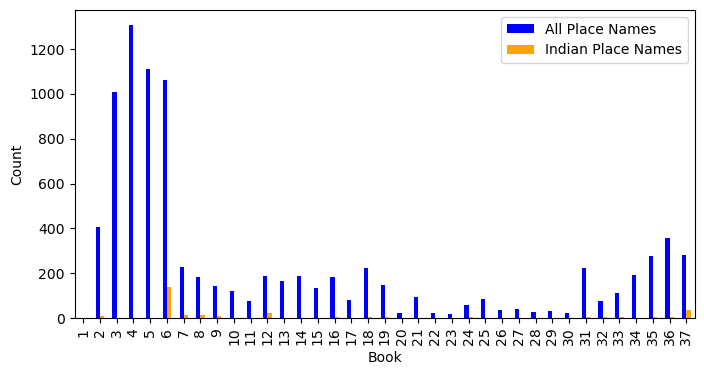

In [9]:
#| label: fig-grouped_place_name_count_comparison
#| fig-cap: Occurence count of all place names and Indian place names in each book

import matplotlib.pyplot as plt

# Compute the grouped count of place names in the current DataFrame
allplacecount = geotext_whole_update.groupby('Book')['Chapter'].count()

# Compute the grouped count of place names in the other DataFrame
indianplacecount = india_update.groupby('Book')['Place_Name'].count()

# Combine the counts into a single DataFrame
combined_counts = pd.concat([allplacecount, indianplacecount], axis=1)
combined_counts.columns = ['All Place Names', 'Indian Place Names']
combined_counts.fillna(0, inplace=True)

fig, ax = plt.subplots(figsize=(8, 4))

# Plot the combined counts as a bar chart with different colors
combined_counts.plot.bar(color=['blue', 'orange'], ax=ax)


# Customize the plot
ax.set_xlabel('Book')
ax.set_ylabel('Count')

# Show the plot
plt.show()


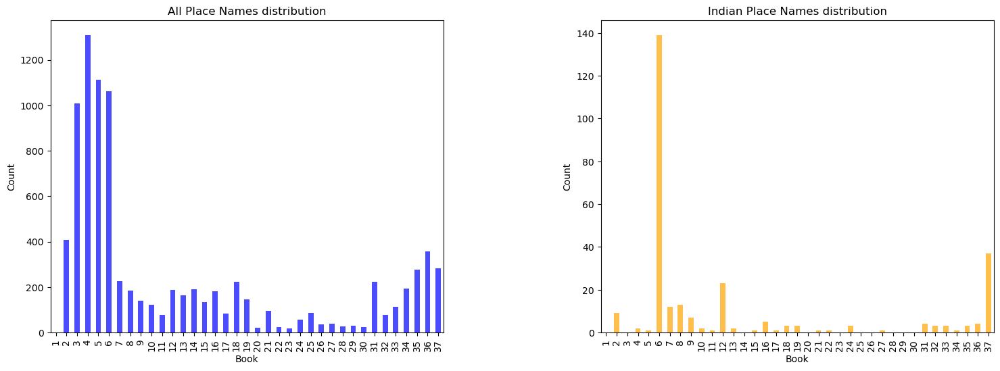

In [11]:
#| label: fig-subplots_place_name_count_comparison
#| fig-cap: Occurence count for of place names and Indian place names in each book_different y-axis scales 

# Set up the figure and axes for the subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot the bar chart for 'All Place Names' on the first subplot
combined_counts['All Place Names'].plot(kind='bar', ax=ax1, color='blue', alpha=0.7)
ax1.set_xlabel('Book')
ax1.set_ylabel('Count')
ax1.set_title('All Place Names distribution')

# Plot the bar chart for 'Other Place Names' on the second subplot
combined_counts['Indian Place Names'].plot(kind='bar', ax=ax2, color='orange', alpha=0.7)
ax2.set_xlabel('Book')
ax2.set_ylabel('Count')
ax2.set_title('Indian Place Names distribution')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4)

# Show the plot
plt.show()

The figures reveal a distinct difference between the occurrence trends of Indian place names and of all place names collectively. The mentions of the Indian places is highly concentrated in books 6, 12, and 37 in *Natural History*, which indicates that the Indian place names are closely tied to specific themes and topics in the narrative.

In this regard, three methodologies have been employed to analyse the India-related text in *Natural History*, including word frequency and collocation analysis, topic modelling, and network analysis, in order to explore the underlying themes and content structure associated with the Indian place names in the work.

Word frequency and collocation analysis helps to identify significant word patterns and combinations in the textual content, providing an overview of the potential keywords in the work.

While topic modelling allows for a broader exploration of the thematic landscape within the India-related text in the work. The lantent major topics emerged from the narratives could be interpreted from the model-clustered keywords and further integrated with a close reading of the context where the place names mentioned.

Furthermore, network analysis offers a visualisation of the interconnections among the place names and other entities in the India-related text throughout the work. By examining the relationships between different locations and named entities, this analysis uncovers the geographical and conceptual networks within the text, revealing how the content about India is structured in *Natural History*.

Together, these methodologies aim to provide a nuanced comprehension of the narratives about India in *Natural History* by delving into the linguistic patterns, thematic traits, and content network of the India-related text in the work.

### Word frequency and collocating bi-grams

Using the measurements available in the [NLTK](https://www.nltk.org/) package, a list of word frequency and collocating bigrams were compiled from the text associated with Indian place names in *Natural History*. These outputs provide an overview of the most commonly used words and word patterns, suggesting the potential keywords in the text.

Upon initial observation, "India" and "one" ranked high in the frequency list. However, since the passages would inevitably include the word "India" in the discussion of the region, making it less informative as a keyword. Similarly, the word "one" appeared as a generic descriptor for referring to a type of tribe, plant, or attributes like distance, volume, or range, offering limited relevance as a keyword. Therefore, these two common but less informative words were further excluded from the tokens for the frequency list compiling. 

In [14]:
indiatokenlist = [word for paragraph in tokenize_paragraphs(geotext_india['Text'].drop_duplicates()) for word in paragraph]
indiatokenlist = [token for token in indiatokenlist if token != 'india' and token != 'one']

# apply the freqency distribution function to the token list
freq_dist = nltk.FreqDist(indiatokenlist)

# Sort the words by frequency in descending order
sorted_words = freq_dist.most_common()

# Get the frequency of the 20th word
top_count = sorted_words[188][1]

# Get all words with frequencies greater than or equal to the frequency of the 20th word
top_words = [(word, count) for word, count in sorted_words if count >= top_count]

corpus_size = len(indiatokenlist)
top_freq = len(top_words)
top_freq_ratio = round(top_freq/corpus_size*100)
top_freq_ratio

display(Markdown("""Among {corpus_size} tokens excluding "India" and "one" within the India-related text in *Natural History*, 
{top_freq} (the top {top_freq_ratio}%) frequently occurring words 
are displayed in @fig-freqwords_treemap and @fig-freqwords_wordcloud.""".format(corpus_size = corpus_size, top_freq = top_freq, top_freq_ratio = top_freq_ratio)))

Among 17729 tokens excluding "India" and "one" within the India-related text in *Natural History*, 
201 (the top 1%) frequently occurring words 
are displayed in @fig-freqwords_treemap and @fig-freqwords_wordcloud.

In [21]:
#| output: false
top_words

[('also', 199),
 ('stone', 171),
 ('river', 123),
 ('called', 98),
 ('hundred', 96),
 ('colour', 96),
 ('name', 94),
 ('like', 94),
 ('found', 82),
 ('sea', 80),
 ('island', 79),
 ('people', 76),
 ('even', 76),
 ('city', 70),
 ('mile', 67),
 ('kind', 67),
 ('known', 60),
 ('come', 59),
 ('day', 55),
 ('tree', 55),
 ('two', 54),
 ('made', 52),
 ('indian', 52),
 ('nation', 52),
 ('place', 51),
 ('white', 51),
 ('part', 50),
 ('water', 50),
 ('black', 46),
 ('king', 45),
 ('among', 44),
 ('arabia', 43),
 ('country', 43),
 ('well', 42),
 ('mountain', 42),
 ('time', 41),
 ('elephant', 41),
 ('however', 41),
 ('salt', 41),
 ('gold', 41),
 ('foot', 40),
 ('distance', 40),
 ('used', 40),
 ('variety', 40),
 ('say', 39),
 ('upon', 39),
 ('many', 39),
 ('alexander', 37),
 ('another', 37),
 ('region', 37),
 ('red', 36),
 ('sun', 35),
 ('said', 35),
 ('great', 34),
 ('others', 34),
 ('three', 34),
 ('writer', 34),
 ('first', 34),
 ('make', 32),
 ('animal', 32),
 ('amber', 32),
 ('district', 31),
 (

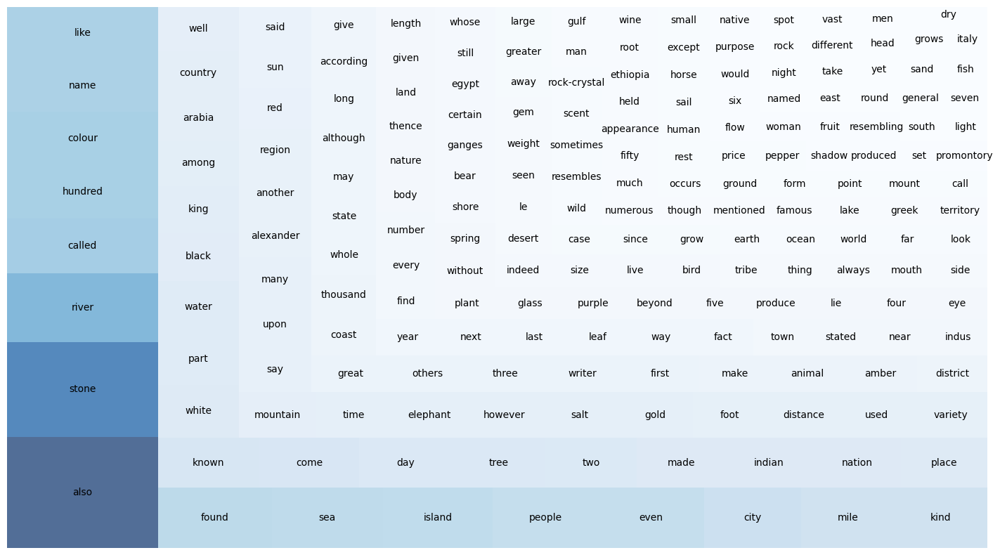

In [19]:
#| label: fig-freqwords_treemap
#| fig-cap: Top 1% frequent words in Indian subcontinent related text as tree map

import squarify
import matplotlib.cm as cm

# top_words contains the list of (word, count) tuples
labels = [word for word, _ in top_words]
sizes = [count for _, count in top_words]

# Normalize the sizes to range between 0 and 1
normalized_sizes = [(size - min(sizes)) / (max(sizes) - min(sizes)) for size in sizes]

# Define the color scale
color_scale = cm.Blues

plt.figure(figsize=(18, 10))
squarify.plot(sizes=sizes, label=labels, alpha=0.7, color=color_scale(normalized_sizes))

# Add labels and title
plt.axis('off')

# Show the treemap
plt.show()

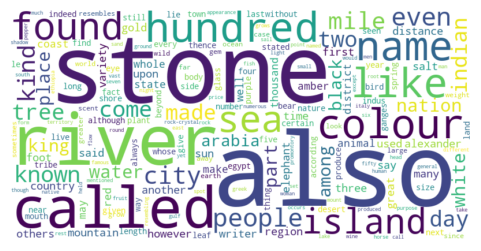

In [20]:
#| label: fig-freqwords_wordcloud
#| fig-cap: Top 1% frequent words in Indian subcontinent related text as word cloud

from wordcloud import WordCloud
# top_words contains the list of (word, count) tuples
wordcloud_data = {word: count for word, count in top_words}

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white')

# Generate the word cloud from the word frequency data
wordcloud.generate_from_frequencies(wordcloud_data)

# Display the word cloud
plt.figure(figsize=(6, 3))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

# Show the plot
plt.show()

One intriguing observation from the word frequency sorting is the prominence of the word "also" in the given text. The frequent appearance of 'also' may be attributed to the encyclopaedic nature of the work, as it is often used to draw comparisons when introducing species and natural phenomena.

For example, in India-related text of *Natural History*, 'also' appears when introducing a natural phenomenon, plant or human activity, and then comparing it with its counterparts in India. Therefore, the common use of 'also' may suggest that India has a significant role in providing a contrast in the broader narrative.

As shown in the following examples where "also" appears in the India-related text in *Natural History*, it is indeed used when introducing a natural phenomenon, plant or human activity, and then comparing it with its counterparts in India. Therefore, the common use of 'also' may suggest that India has a significant role in providing a contrast in the broader narrative.

>2.75.1 "**Also** in India at the well-known port of Patala the sun rises......"

>12.10.1 "In India there is **also** a thorn the wood of which resembles ebony......"

>12.15.1 "There is **also** in India a grain resembling that of pepper, but larger and more brittle......"

>12.17.1 "Arabia **also** produces cane-sugar, but that grown in India is more esteemed."

The hypothesis is further supported towards the end of book 37, where Pliny concludes his extensive discussion on "Nature". In 37.77.1, Pliny gives the highest praise to Italy, believing it to have earned the title of "Nature's crown". In this context, while giving his preference and overall assessment, Pliny makes a final mention of "India". He suggests that, "if we leave aside the fabulous marvels of India"^[*Natural History* 37.77.1 (<a href="https://topostext.org/work/153" target="_blank">https://topostext.org/work/153</a>)], Spain can be regarded as an appealing destination, second only to Italy. This accidental emphasis on India implies that it has significant importance as a distant contrast to the Mediterranean region, where *Natural History* focuses its attention.

Notably, the words "stone", "river", "called", and "colour" stand out in the word frequency sorting that is followed by the word "also". These frequent occurrences indicates some potential themes about India in the work, which aligns with the distribution of Indian place names as depicted in @fig-subplots_place_name_count_comparison. 

It was found that the three books with the highest mentions of Indian place names are book 6, which covers specific topics on the Nations of India, the Ganges and Indus (two main rivers in India), and routes of voyages to India; book 12, which includes introductions to trees, their economic values of roots and leaves, and information on plants' medicinal and flavouring effects; and book 37, which focuses on descriptions of different types of gemstones where the principle types are introduced in a sequence and category of colours, accompanied with criticism regarding the luxury trade these gemstones represent.

The frequent mention of the word "river" in India-related text could be attributed to the references to voyage and trade routes concerning India. Also, as pointed out by @roller2022, the Roman ideology attached great significance to rivers, as they symbolised the opening of a territory and characterized the inland regions together with mountains, where the Romans originated. This ideology, also reflected in Pliny's writing, contrasts with what he inherited from the Greek geographical scholarship that lays a focus on coasts. 

The terms "stone" and "color" connect directly to the content of Book 37, which concentrates on gemstones, thereby identifying "gemstones" as a prominent theme in the narrative.

The two themes inferred from the frequently occurring words suggest that the geographic location and the routes towards India, along with its contribution as the source of numerous plants, animals, and gemstones, are of considerable importance in the content about India in *Natural History*.

In addition to observing word frequency, collocation analysis is used to explore common word patterns within the text about India in *Natural History*.

In [16]:
from nltk import bigrams

bi_grams = list(bigrams(indiatokenlist))

india_bigram_count = len(bi_grams)
india_bigram_show = round(india_bigram_count*0.001)

display(Markdown("""
Using the likelihood ratio measurement, the collocating bi-grams that rank within the top 0.1% likelihood are extracted.
As a result of this selection process, {india_bigram_show} out of {india_bigram_count} bigrams 
that are that are highly significant and likely to co-occur in the target corpus are obtained.""".format(india_bigram_count = india_bigram_count, india_bigram_show = india_bigram_show)))


Using the likelihood ratio measurement, the collocating bi-grams that rank within the top 0.1% likelihood are extracted.
As a result of this selection process, 18 out of 17728 bigrams 
that are that are highly significant and likely to co-occur in the target corpus are obtained.

During the first observation, it was noticed that about one third of the extracted bigrams contained the word 'hundred', e.g. in ('hundred', 'fifty') and ('six', 'hundred'). These bigrams typically represent measurements for distance, object length or quantity, providing limited descriptive information about the text's content. Subsequently, the word "hundred" was excluded from further bigram extraction to concentrate on more informative and relevant co-occurring words.

The updated output bigrams are listed as follows:

In [21]:
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures

keywords = ['hundred']

finder = BigramCollocationFinder.from_words(indiatokenlist)

for keyword in keywords:
    finder.apply_word_filter(lambda w: w == keyword.lower())

measures = BigramAssocMeasures()

finder.nbest(measures.likelihood_ratio, 18)

[('alexander', 'great'),
 ('father', 'liber'),
 ('caspian', 'gate'),
 ('fifty', 'mile'),
 ('denarii', 'pound'),
 ('gold', 'silver'),
 ('precious', 'stone'),
 ('river', 'indus'),
 ('fourteen', 'equinoctial'),
 ('olive', 'oil'),
 ('asia', 'minor'),
 ('equinoctial', 'hour'),
 ('lapis', 'lazuli'),
 ('red', 'sea'),
 ('mile', 'breadth'),
 ('emperor', 'nero'),
 ('already', 'mentioned'),
 ('ft.', 'long')]

The compiled bigrams can be broadly classified into four categories:

**Historical figures**:
('alexander', 'great'), ('father', 'liber'), ('emperor', 'nero')

**Geographical locations and features**:
('caspian', 'gate'), ('river', 'indus'), ('asia', 'minor'), ('red', 'sea')

**Meseuarments (distance, currency, length, time)**:
('fifty', 'mile'), ('denarii', 'pound'), ('fourteen', 'equinoctial'), ('equinoctial', 'hour'), ('mile', 'breadth'), ('ft.', 'long')

**Trading goods**:
('gold', 'silver'), ('precious', 'stone'), ('olive', 'oil'), ('lapis', 'lazuli')

On one hand, the bigrams associated with geographical locations, distance, and time measurements in the India-related text confirm India's geographical significance, which is in line with the earlier discoveries from the word frequency list and literature review. On the other hand, within the framework of the Indo-Mediterranean exchange, the appearance of bigrams related to geographical locations, currency measurements, and trading goods highlights the significance of India's role in the merchandise trade in the context of *Natural History*.

Moreover, the presence of noteworthy individuals like Alexander III, the Great (king of Macedon), Nero (Roman emperor), and Father Liber (referring to Dionysus, the Greek god of winemaking and wine), in historical accounts or mythical narratives, suggests their association with India in terms of either expeditions or folklore (It is believed that Dionysus conquered India in a Greek epic). This observation presents an opportunity to cluster the names of individuals mentioned in the text, thus exposing the underlying content structure pertaining to India in *Natural History*. This will be discussed in detail in the Network Analysis section (@sec-network).

To conclude, the analysis of word frequency and collocation in the India-related text in *Natural History* demonstrates notable word patterns. These patterns indicate that India plays a significant role as a geographical contrast, compared in terms of distance, natural phenomena, and product origin with other regions introduced in the narrative. Moreover, it is emphasised for its significant role in merchandise trade in the representation of India in *Natural History*.

### Topic modelling

Furthermore, a topic modelling approach is applied to uncover the underlying topics relating to India in the work. Topic modelling is a widely used method for text analysis that infers the latent topics present in a collection of documents [@bail; @underwood2012]. Latent Dirichlet Allocation (LDA), which is the most commonly employed algorithm for topic modelling, operates under the assumption that each document contains a mixture of different topics, and each topic is defined as a collection of words that may appear with varying probabilities in the passages [@underwood2012;@kapadia2022].

In this study, the collection of India-related text in *Natural History*, which is segmented into paragraphs, is considered as separate "documents". The semantic vectorization and implementation of the LDA model on groups of words in the text is achieved by utilizing the [Gensim](https://radimrehurek.com/gensim/) library in Python^[The LDA implementation code was referenced from a tutorial by @barber].

Due to the small corpus size of text pertaining to Indian place names, the number of topics has been determined to be 3, with 40 passes, based on an assessment of the coherence score distribution depicted in Figure @fig-topic_coherence_distribution. This approach aims to obtain the most optimal and non-overlapping topic clusters.

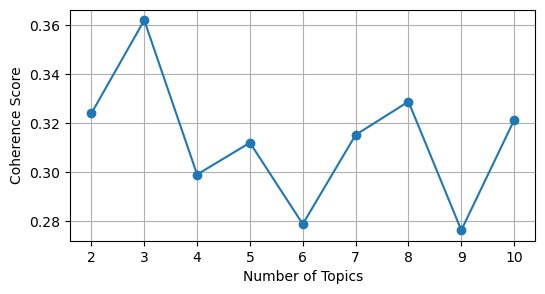

In [75]:
#| label: fig-topic_coherence_distribution
#| fig-cap: Conherence distribution of different topic numbers when passes=40

topic_range = range(2, 11)

# Initialize lists to store coherence scores
coherence_scores = []

# Tokenize and create the corpus and dictionary
indiapara = tokenize_paragraphs(geotext_india['Text'].drop_duplicates())
#indiapara = [[word for word in paragraph if word != 'india'] for paragraph in indiapara]
indiadictionary = corpora.Dictionary(indiapara)
indiacorpus = [indiadictionary.doc2bow(text) for text in indiapara]

# Calculate coherence scores for different topic numbers
for num_topics in topic_range:
    indialdamodel = gensim.models.ldamodel.LdaModel(
        indiacorpus, num_topics=num_topics, id2word=indiadictionary, passes=40
    )
    coherence_model = CoherenceModel(
        model=indialdamodel, texts=indiapara, dictionary=indiadictionary, coherence='c_v'
    )
    coherence_scores.append(coherence_model.get_coherence())

# Plot the coherence scores against the number of topics
plt.figure(figsize=(6, 3))
plt.plot(topic_range, coherence_scores, marker='o')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.xticks(topic_range)
plt.grid(True)
plt.show()

The list of 30 keywords, organised into the three assigned topics, is displayed below.

In [27]:
## topic modelling about texts related to "India"

## import the necessary modules

indialdamodel = gensim.models.ldamodel.LdaModel(indiacorpus, num_topics=3, id2word = indiadictionary, passes=40)

from pprint import pprint
pprint(indialdamodel.print_topics(num_topics=3, num_words=30))

[(0,
  '0.014*"stone" + 0.011*"also" + 0.007*"colour" + 0.007*"india" + '
  '0.007*"found" + 0.006*"like" + 0.004*"one" + 0.004*"black" + 0.004*"tree" + '
  '0.004*"amber" + 0.004*"name" + 0.003*"known" + 0.003*"white" + 0.003*"kind" '
  '+ 0.003*"gold" + 0.003*"made" + 0.003*"even" + 0.003*"called" + '
  '0.003*"indian" + 0.003*"glass" + 0.002*"part" + 0.002*"people" + '
  '0.002*"used" + 0.002*"variety" + 0.002*"many" + 0.002*"river" + '
  '0.002*"make" + 0.002*"rock-crystal" + 0.002*"island" + 0.002*"red"'),
 (1,
  '0.009*"stone" + 0.008*"also" + 0.007*"india" + 0.006*"like" + 0.006*"kind" '
  '+ 0.006*"colour" + 0.005*"name" + 0.005*"one" + 0.004*"called" + '
  '0.004*"even" + 0.004*"white" + 0.003*"pepper" + 0.003*"variety" + '
  '0.003*"another" + 0.003*"known" + 0.003*"tree" + 0.003*"black" + '
  '0.003*"weight" + 0.003*"leaf" + 0.003*"purple" + 0.002*"grain" + '
  '0.002*"people" + 0.002*"denarii" + 0.002*"used" + 0.002*"nard" + '
  '0.002*"resembles" + 0.002*"pound" + 0.002*"t

In [17]:
#| output: false

coherence_model = CoherenceModel(model=indialdamodel, texts=indiapara, dictionary=indiadictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print("Coherence Score:", coherence_score)

Coherence Score: 0.3756133994728454


Based on the prominent categories of the keywords and the possible interconnections within each group, an interpretation of the topic emerging from each keyword cluster can be drawn as follows.

**Group 0**: This group consists of keywords related to precious stones such as "stone", "amber", "rock-crystal"and "glass", with colour references like "black", "white", and "red". Therefore, the underlying topic appears to be the description of precious stones.

**Group 1**: This group includes various natural products such as "tree", "leaf", "pepper", "grain" and "nard", together with descriptive words such as "weight", "pound" and "taste". In addition, the ancient Roman currency 'denarii' appears in the group, suggesting a possible topic related to trade with India.

**Group 2**: This group contains various geographical features such as "river", "island", "sea" and "mountain". It also includes terms related to cities, nations, kings and distances, and the name "Alexander", referring to Alexander the Great, who undertook an expedition to the Indian subcontinent. "Elephant", as an important possession of the king in India during Pliny's time, also represents the power and size of the Indian kingdoms. In this respect, the underlying topic for this group probably relates to geography and society in India.

The interactive visualisation of the 3 topic clusters, manifesting the intertopic distance map and the most salient/relevant terms within the given text and their contributing weights for each topic, can be accessed in the HTML version of this [thesis](https://raw.githack.com/lizaodawn/NH_thesis/main/NHthesis_structure.html).

The static demonstration of the visualisation can be seen in @fig-topic_cluster0, @fig-topic_cluster1, @fig-topic_cluster2 and @fig-topic_cluster3.

The intertopic distance map is shown in the left panel of the interactive graph. Each bubble represents a topic, and the size of the bubble indicates the percentage of texts in the corpus that contribute to that topic. The distance between the bubbles indicates the degree of difference between them. And a good topic model is expected to have large and non-overlapping bubbles scattered across the graph [@tran2022]. 

And the most salient/relevant keyword is shown in the right panel. The blue bars show the total frequency of each word in the corpus when no topic is selected. When hovering over one of the bubbles to select a specific topic, red bars will appear in the right panel showing the estimated frequencies of the terms in the selected topic, with the blue bar remaining in the background as a reference. The word with the longest red bar is estimated to contribute the most to the texts belonging to this topic. 

By hovering over a specific word in the right panel, the different contribution of a particular word to each topic can be seen.

In [38]:
import pyLDAvis
import pyLDAvis.gensim_models

# Convert the LdaModel object to a pyLDAvis-compatible format
vis_dataindia = pyLDAvis.gensim_models.prepare(indialdamodel, indiacorpus, indiadictionary, R=30, sort_topics=False)

# Enable the Jupyter notebook inline display of visualisations
pyLDAvis.enable_notebook()

# Display the pyLDAvis visualisation
pyLDAvis.display(vis_dataindia)

C:\Users\dawn\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
C:\Users\dawn\anaconda3\lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


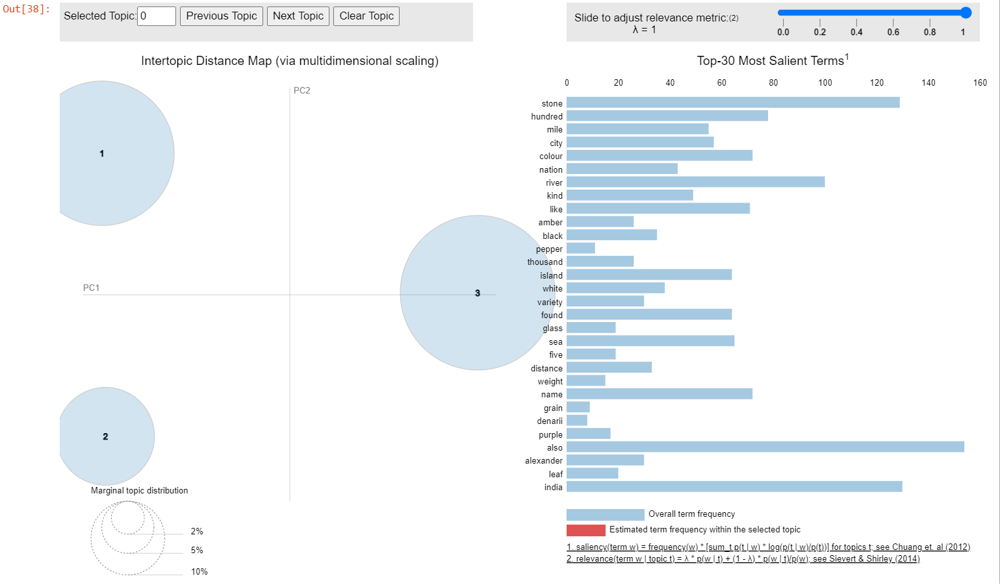

In [39]:
#| label: fig-topic_cluster0
#| fig-cap: Topic cluster (overall) 

Image(filename='topicmodeling00_pdf.png')

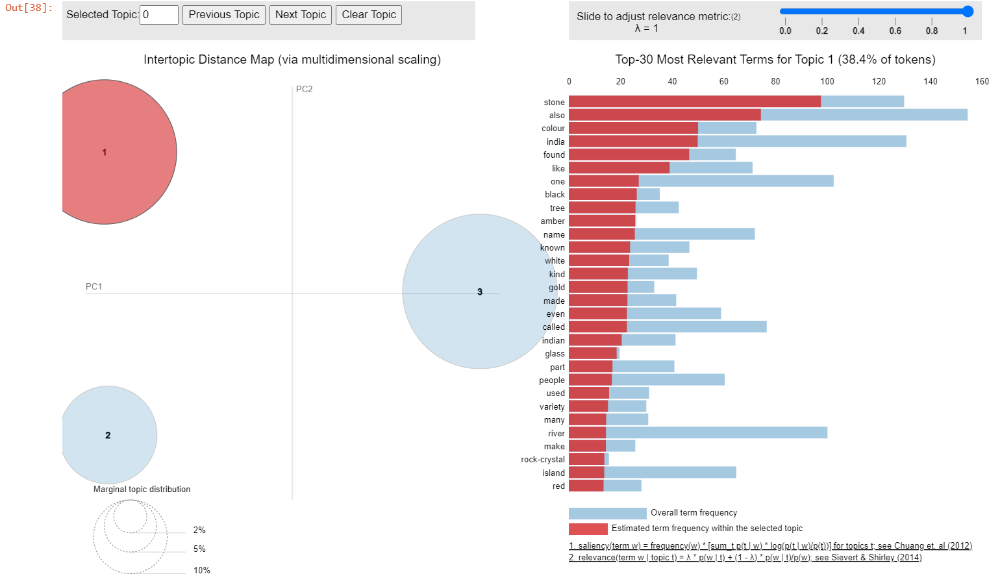

In [40]:
#| label: fig-topic_cluster1
#| fig-cap: Topic cluster (highlighting on Topic_0)

Image(filename='topicmodeling01_pdf.png')

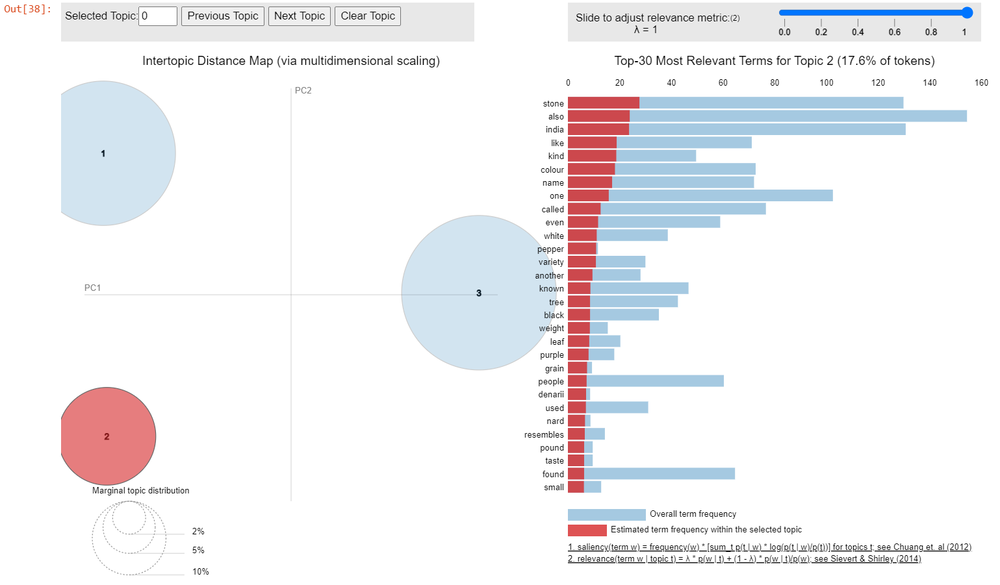

In [41]:
#| label: fig-topic_cluster2
#| fig-cap: Topic cluster (highlighting on Topic_1)

Image(filename='topicmodeling02_pdf.png')

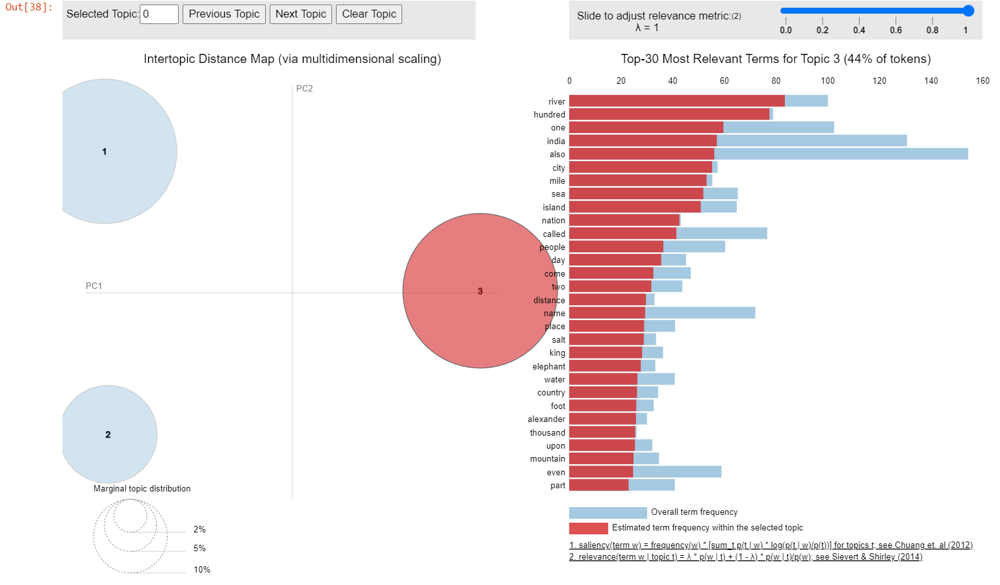

In [42]:
#| label: fig-topic_cluster3
#| fig-cap: Topic cluster (highlighting on Topic_2)

Image(filename='topicmodeling03_pdf.png')

In the visualisation above, the three keyword clusters are distanced from each other, indicating that they formed different potential topics within the given text. And the first topic (about stones) and the last topic (about Indian geography and society) took up a more significant proportion compared to the second topic (about merchandise trade).

In addition, the specific context of the Indian places mentioned in *Natural History* was manually summarised and categorised into broader types to serve as a comparison and extension to the topics generated by the model. The initial comments on context are based on a close reading of the relevant text, taking into account the book and chapter theme indicated in the text. The comments and summary are stored in CSV format and imported as a Pandas dataframe.

In [18]:
#| output: false

india_close_context = pd.read_csv('india_corpus_close_reading.csv')
india_close_context['Context summary'] = india_close_context['Context summary'].str.split('; ')
india_close_context = india_close_context.explode('Context summary')

mapping = {
    'goods/animals/plants origin': 'goods/animals/plants origin',
    'geographical reference': 'geographical reference',
    'focused introduction': 'general introduction',
    'origin of high quality goods': 'prominent features',
    'origin of the large sized objects': 'prominent features',
    'passing mention': 'passing mention',
    'human activities relating to plants/animals': 'producing activity',
    'criticism of luxury goods trade': 'criticism',
    'conquest history': 'conquest history',
    'transportation': 'general introduction',
    'marvels in India': 'prominent features',
    'criticism of human greed': 'criticism',
    'criticism of interference with nature': 'criticism',
    'product/knowledge exchange': 'product/knowledge exchange',
    'goods producing activity': 'producing activity'
}

india_close_context['Context type'] = india_close_context['Context summary'].map(mapping)

india_close_context.iloc[:, :-2].join(india_close_context.iloc[:, -1]).head()

,Book,Chapter,Paragraph,Comment,Context summary,Context type
0,2,75,1,"astronomy, mentioning how the sun motivation i...",geographical reference,geographical reference
1,2,98,1,"description of mountain, mentioning Indus river",geographical reference,geographical reference
2,2,112,1,"description of scope of the world, mentioning ...",geographical reference,geographical reference
3,4,17,4,"topic on Macedonia, metioning it once conquere...",conquest history,conquest history
4,4,26,2,"description of habitants, mentioned a river in...",geographical reference,geographical reference


In [20]:
context_type = india_close_context['Context type'].unique().tolist()

display(Markdown("""
And the summarised comments were further categorized into seven types, namely {context_type}.
""".format(context_type = context_type)))


And the summarised comments were further categorized into seven types, namely ['geographical reference', 'conquest history', 'passing mention', 'general introduction', 'criticism', 'prominent features', 'goods/animals/plants origin', 'producing activity', 'product/knowledge exchange'].


A detailed introduction to these seven context catergories with examples of passages can be found below. 

**Geographical reference**: refers to the occurrence of Indian place names as a geographical reference in the narrative, for example:

> 2.112.1 "...from the river **Ganges** and its mouth where it flows into the Eastern Ocean, through **India** and Parthyene to the Syrian city of Myriandrus situated on the Issic gulf 5,215..."

**Passing mention**: refers to the condition that the Indian place names are included as a passing reference, e.g:

> 5.11.1 "...Coptos, which from its proximity to the Nile, forms its nearest emporium for the merchandise of **India** and Arabia..."

**Conquest history**: refers to the mention of Indian place names in the context of the conquest history of Alexander the Great, for example:

> 8.61.2 "...When Alexander the Great was on his way to **India**, the king of Albania had presented him with one dog of unusually large size..."

**General introduction**: refers to the focused introduction about the general situation of places in the India, including the transport in the work, it is usually indicated directly at the beginning of the associated chapter. For example, the whole of chapter 21 of book 6 has a leading topic as "The Nations of India", the whole of chapter 22 of book 6 has a leading topic as "The Ganges".

**Prominent features**: In *Natural History*, plants and animals from India are often noted for their large size, and Pliny often highlights the good quality of Indian products in his discussion, this kind of context is categorised as "prominent features" of India. For example:

>8.14.1 "...Megasthenes writes that in **India** snakes grow so large as to be able to swallow stags and bulls whole..."

>37.21.1 "...**India**, likewise, is the sole producer of these stones and combining, as they do, the brilliant qualities of the most valuable gems, they above all others description..."

**Goods/animals/plants origin**: There are also many descriptions of India as the origin of various goods, animals and plants, this type of context refers to those without specific comments on their size or quality, just mentioning that the object originated in India, for example:

>8.25.2 "Hyrcania and **India** produce the tiger, au animal of terrific speed..."

**Producing activity**: this type refer to the cases that introduce about the human activity or specific production process about natural creatures or commercial products, such as

>8.8.1 "The method of capturing them in **India** is for a mahout riding one of the domesticated elephants..."

>37.20.1 "...The **Indians** have found a way of counterfeiting various precious stones, and beryls in particulars by staining rock-crystal."

**Criticism**: woven into the description of trade with the India, Pliny had drawn direct criticism about the human greed and unnecessary interference on nature it represents, hence these narratives are specifically grouped together, for example:

>12.14.2 "To think that its only pleasing quality is pungency and that we go all the way to India to get this! Who was the first person who was willing to try it on his viands, or in his greed for an appetite was not content merely to be hungry?"

>22.56.1 "I myself shall not touch upon drugs imported from India and Arabia or from the outer world. Ingredients that grow so far away are unsatisfactory for remedies...Let them be bought if you like to make perfumes, unguents and luxuries, or even in the name of religion, for we worship the gods with frankincense and costmary. But health I shall prove to be independent of such drugs, if only to make luxury all the more ashamed of itself."

>33.2.1 "It came to be deemed the proof of wealth, the true glory of luxury, to possess something that might be absolutely destroyed in a moment. Nor was this enough: we drink out of a crowd of precious stones, and set our cups with emeralds, we take delight in holding India for the purpose of tippling, and gold is now a mere accessory."

**Product/knowledge exchange**: In some circumstances, Pliny also mentioned about the exchange of knowledge and products during the trade, such as:

>34.48.3 "India possesses neither copper nor lead, and procures them in exchange for her precious stones and pearls."

>37.23.2 "...Indeed, as is generally known, in India the stone is exposed to view by the mountain streams...Later we persuaded the Indians to share our appreciation of it."

And the distribution of context types derived from close reading is shown in @fig-book_context_distribution and @fig-context_type_freq.

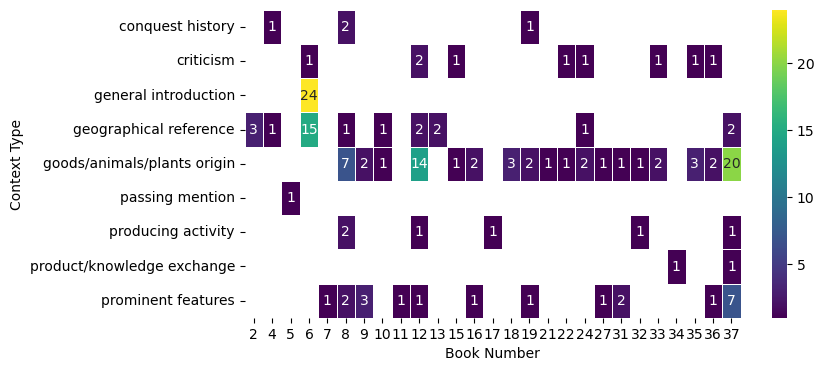

In [24]:
#| label: fig-book_context_distribution
#| fig-cap: Context type distribution in books containing Indian place names

import seaborn as sns

grouped_data = india_close_context.groupby(['Book', 'Context type']).size().reset_index(name='Count')

# Pivot the grouped_data to create the heatmap matrix
heatmap_data = grouped_data.pivot(index='Context type', columns='Book', values='Count')

# Create the heatmap using seaborn
plt.figure(figsize=(8, 4))
sns.heatmap(heatmap_data, cmap='viridis', annot=True, linewidths=0.5, cbar=True)

# Set labels and title
plt.xlabel('Book Number')
plt.ylabel('Context Type')

# Show the plot
plt.show()

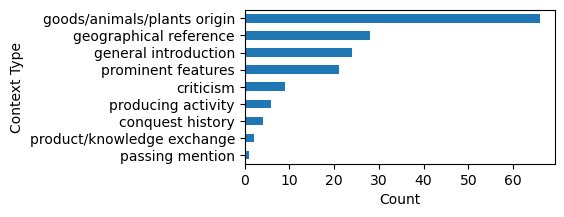

In [25]:
#| label: fig-context_type_freq
#| fig-cap: Occurence frequency of different context type in India-related text 

context_rank = india_close_context['Context type'].value_counts(ascending = True)

plt.figure(figsize=(4, 2))
context_rank.plot(kind='barh')
plt.xlabel('Count')
plt.ylabel('Context Type')
plt.show()

In general, by integrating close reading and topic modelling, the contexts inferred from close reading can enrich the topics generated by the model, providing more intricate detail to the keyword clusters. 

For example, within the overarching themes of 'stones', 'trade' and 'contrasting nation' that emerge from the content about India in *Natural History*, the theme of 'stones' not only encompasses the description of various gemstones in terms of their colour and texture, but also positions India as the source of these precious stones of the highest quality. The abundance of references to Indian places as geographical markers, coupled with a focused introduction to India's natural, social and political circumstances, contributes significantly to the formation of a major theme that presents India as a contrasting entity to the Roman Empire. Notably, the narrative also touches on the historical context of the Roman conquest of the Indian subcontinent within this theme.

Furthermore, the theme of 'trade', though seemingly smaller in scope than the previous two, is of particular significance as it reflects Pliny's Stoic perspective, which reveres nature as divine and condemns excessive material desire that disrupts natural harmony [@beagon1996]. 

Beyond the observation that India is both a geographical counterpoint and an important trading partner within the narrative, the integration of topic modelling and close reading leads to a more nuanced portrayal of India. This portrayal presents India as a junction where the conquest narratives of the Roman Empire intersect with Stoicism's critique of human greed, all the while being adorned with an abundance of natural wonders and the world's finest products.

### Network analysis for named entities {#sec-network}

In addition to the previous methods, which partially answered the question "How is India described?" in *Natural History*, a network analysis of the named entities in the text can shed light on the structure of the India-related content in the work. Inspired by the person name collocations observed in the collocation analysis, the initial idea for this section is to extract the person names mentioned in the India-related text and generate an entity cluster for the person names, place names and book numbers to explore how the content is structured in context.

Using the extended dataset of Indian place name annotations, different place names (including annotated places outside India), person names and book numbers are considered as nodes. Edges are counted when two nodes co-occur, such as a person name and a place name, or two different place names in the same paragraph. The number of the book in which these names appear will also be counted as an edge.

In order to identify the influence of different entities in the discourse, the centrality of nodes is measured and represented by their size. And the weight of the edge between two nodes represents the time that the two entities appear together in the same context. The graph, which has been run through a Force Atlas 2 layout algorithm, also shows the rough clustering of entities that tend to be mentioned close together.

In [21]:
india_file_ids = india_update['FILE_ID'].unique()
india_update_withtext = geotext_whole_update[geotext_whole_update['FILE_ID'].isin(india_file_ids)]

wholebook['FILE_ID'] = wholebook['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
wholebook.set_index('FILE_ID', inplace=True)
wholebook.reset_index(inplace=True)

india_update_withtext = india_update_withtext.merge(wholebook[['FILE_ID', 'Text']], on='FILE_ID', how='left')

In [23]:
india_nw = len(india_update_withtext)

display(Markdown("""Indexed with the book-chapter-paragraph number of the passages in the India-related text, 
the place names outside India while mentioned in the same paragraph are also included in the network analysis.
Combining the original TOPOSText annotations and the added annotations,
there are a total of {india_nw} occurrences of place names in paragraphs of India-related text in *Natural History*.
""".format(india_nw = india_nw)))

Indexed with the book-chapter-paragraph number of the passages in the India-related text, 
the place names outside India while mentioned in the same paragraph are also included in the network analysis.
Combining the original TOPOSText annotations and the added annotations,
there are a total of 908 occurrences of place names in paragraphs of India-related text in *Natural History*.


#### Person name annotation/tagging retrieval

To extract the names of people within the captioned text, approaches of retrieval from the TOPOSText annotation and from the text tagging given by the pre-trained multilingual named entity recognition models [WikiNEuRal](https://huggingface.co/Babelscape/wikineural-multilingual-ner) [@tedeschi2021] and [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast) [@akbik2018coling] are compared to adopt the most complete output.

**I. Annotation retrieval from TOPOSText**

Besides place names, a catalogue of proper names including persons, gods, festibals, animals and artworks is identified in the classical text on TOPOSText. Every proper name is assigned a distinct URI as its identifier in the HTML format, as demonstrated in the following example: **\<a href="/people/54" target="_blank">Muses\</a>**.

Using the [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) tools, the proper names, together with their respective URIs and the book-chapter-paragraph numbers in which they appear, can be retrieved from the URLs of the two sections of *Natural History* on TOPOSText.

In [18]:
#| output: false

# check the format of annotation on TOPOSText with tag as "people"
def people_annotation_extract(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", href=lambda href: href and href.startswith("/people/"))
    return links
people_annotation_extract(url1)[:10]

[<a href="/people/54" target="_blank">Muses</a>,
 <a href="/people/1881" target="_blank">Catullus</a>,
 <a href="/people/2300" target="_blank">Cicero</a>,
 <a href="/people/2300" target="_blank">Cicero</a>,
 <a href="/people/382" target="_blank">Manius</a>,
 <a href="/people/1515" target="_blank">Persius</a>,
 <a href="/people/17495" target="_blank">Junius Congus</a>,
 <a href="/people/15495" target="_blank">Lucilius</a>,
 <a href="/people/2300" target="_blank">Cicero</a>,
 <a href="/people/14983" target="_blank">Cato</a>]

In [25]:
#| output: false
# function for retrieving all annotations with "people" tag

def people_annotation_extract(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", href=lambda href: href and href.startswith("/people/"))

    person_names = []
    topos_text_ids = []
    references = []

    for link in links:
        person_name = link.text.strip()
        topos_text_id = link["href"]  # ToposText ID
        parent = link.find_parent("p")
        reference = parent.get("id")

        person_names.append(person_name)
        topos_text_ids.append(topos_text_id)
        references.append(reference)

    # Create a DataFrame from the extracted information
    df = pd.DataFrame({
        'Person_name': person_names,
        'ToposText_ID': topos_text_ids,
        'Reference': references
    })

    return df

peopledf1 = people_annotation_extract(url1)
peopledf2 = people_annotation_extract(url2)
people_annotation = pd.concat([peopledf1, peopledf2], ignore_index=True)
people_annotation.head()

,Person_name,ToposText_ID,Reference
0,Muses,/people/54,urn:cts:latinLit:phi0978.phi001:1.1.1
1,Catullus,/people/1881,urn:cts:latinLit:phi0978.phi001:1.1.1
2,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1
3,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1
4,Manius,/people/382,urn:cts:latinLit:phi0978.phi001:1.2.1


In [28]:
#| echo: false

ppl_book1 = len(peopledf1)
ppl_book2 = len(peopledf2)
ppl_whole = len(people_annotation)

display(Markdown("""The annotated text of *Natural History* on TOPOSText contains 
{ppl_book1} proper name annotations in book 1-11 and {ppl_book2} in book 12-37, 
resulting in a total of {ppl_whole} such annotations throughout the work."""
.format(ppl_book1 = ppl_book1, ppl_book2 = ppl_book2, ppl_whole = ppl_whole)))

The annotated text of *Natural History* on TOPOSText contains 
5109 proper name annotations in book 1-11 and 7038 in book 12-37, 
resulting in a total of 12147 such annotations throughout the work.

The [API](https://topostext.org/api/people/readweb.php) on TOPOSText can provide further validation for the specific annotation type of "person name". In the API file, the gender key for all the entities of people/gods has been assigned the values "male" and "female". Based on this criterion, entities with key-value pairs such as "gender":"animal" or "gender":"other" are filtered out from the retrieved output, as they are not considered as "people". Furthermore, since there is a "concat" value that denotes a detailed name of the person and is shared with all variants of the same URI, the "concat" value is also retrieved for a more accurate identification of the person named entity.

In [59]:
#| output: false

def people_validate(json_data, target_id):
    for item in json_data['records']:
        if item['ID'] == target_id:
            if item.get('gender') in ['male', 'female']:
                return item.get('concat')
            else:
                return False

api_url = f"https://topostext.org/api/people/readweb.php"
response = requests.get(api_url)
data = response.json()
people_annotation['Person_name_concat'] = people_annotation.apply(lambda row: people_validate(data, str(row['ToposText_ID'].split('/')[-1])), axis=1)
people_annotation

,Person_name,ToposText_ID,Reference,Person_name_concat
0,Muses,/people/54,urn:cts:latinLit:phi0978.phi001:1.1.1,Muses (goddesses)
1,Catullus,/people/1881,urn:cts:latinLit:phi0978.phi001:1.1.1,Catullus
2,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
3,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
4,Manius,/people/382,urn:cts:latinLit:phi0978.phi001:1.2.1,Manius
...,...,...,...,...
12142,horses,/people/10959,urn:cts:latinLit:phi0978.phi001:37.74.1,False
12143,cattle,/people/10978,urn:cts:latinLit:phi0978.phi001:37.77.1,False
12144,horses,/people/10959,urn:cts:latinLit:phi0978.phi001:37.77.1,False
12145,Arabian,/people/275,urn:cts:latinLit:phi0978.phi001:37.78.1,False


In [60]:
#| label: tbl-validated_people_anno
#| tbl-cap: Example of retrieved and validated person name annotations in *Naturl History*

validated_people = people_annotation.loc[people_annotation['Person_name_concat']!=False]
validated_people['FILE_ID'] = validated_people['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
validated_people.set_index('FILE_ID', inplace=True)
validated_people.reset_index(inplace=True)
validated_people.head()

C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\896103757.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validated_people['FILE_ID'] = validated_people['Reference'].str.extract(r'(\d+\.\d+\.\d+)')


,FILE_ID,Person_name,ToposText_ID,Reference,Person_name_concat
0,1.1.1,Muses,/people/54,urn:cts:latinLit:phi0978.phi001:1.1.1,Muses (goddesses)
1,1.1.1,Catullus,/people/1881,urn:cts:latinLit:phi0978.phi001:1.1.1,Catullus
2,1.2.1,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
3,1.2.1,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
4,1.2.1,Manius,/people/382,urn:cts:latinLit:phi0978.phi001:1.2.1,Manius


In [37]:
ppl_validate = len(validated_people)
india_ppl_validate = validated_people['FILE_ID'].isin(india_update_withtext['FILE_ID']).sum()

display(Markdown("""The format of the retrieved output for person name annotations in *Natural History* is 
exemplified in @tbl-validated_people_anno. In the entire work, there are a total of {ppl_validate} instances of 
annotated person names, of which **{india_ppl_validate}** appear within text related to India."""
.format(ppl_validate = ppl_validate, india_ppl_validate = india_ppl_validate)))

The format of the retrieved output for person name annotations in *Natural History* is 
exemplified in @tbl-validated_people_anno. In the entire work, there are a total of 6568 instances of 
annotated person names, of which **330** appear within text related to India.

In [61]:
#| output: false
validated_people.loc[validated_people['FILE_ID'].isin(india_update_withtext['FILE_ID'])]

,FILE_ID,Person_name,ToposText_ID,Reference,Person_name_concat
223,2.75.1,Onesicritus,/people/936,urn:cts:latinLit:phi0978.phi001:2.75.1,Onesicritus
224,2.75.1,Alexander,/people/6,urn:cts:latinLit:phi0978.phi001:2.75.1,"Alexander III, the Great (general)"
225,2.75.1,Alexander,/people/6,urn:cts:latinLit:phi0978.phi001:2.75.1,"Alexander III, the Great (general)"
226,2.75.1,Onesicritus,/people/936,urn:cts:latinLit:phi0978.phi001:2.75.1,Onesicritus
283,2.112.1,Hercules,/people/4,urn:cts:latinLit:phi0978.phi001:2.112.1,"Heracles (s. of Zeus), Hercules"
...,...,...,...,...,...
6554,37.63.1,Memnon,/people/1491,urn:cts:latinLit:phi0978.phi001:37.63.1,Memnon (s. of Tithonus)
6555,37.63.1,Alexander,/people/13,urn:cts:latinLit:phi0978.phi001:37.63.1,Alexander (misc)
6556,37.63.1,Xenocrates,/people/15164,urn:cts:latinLit:phi0978.phi001:37.63.1,Xenocrates of Aphrodisias
6563,37.70.1,Democritus,/people/139,urn:cts:latinLit:phi0978.phi001:37.70.1,Democritus (philosopher)


In [62]:
#| label: tbl-person_anno_merged
#| tbl-cap: Example for person name annotation merged into India-related text dataset

india_update_addpeople_anno = pd.merge(india_update_withtext, validated_people[['FILE_ID', 'Person_name_concat']], on='FILE_ID', how='left')
india_update_addpeople_anno.dropna(subset=['Person_name_concat'], inplace=True)
india_update_addpeople_anno[['FILE_ID', 'Place_Name', 'Book', 'Text', 'Person_name_concat']].head()

,FILE_ID,Place_Name,Book,Text,Person_name_concat
0,2.75.1,Syene,2,Similarly it is reported that at the town of S...,Onesicritus
1,2.75.1,Syene,2,Similarly it is reported that at the town of S...,"Alexander III, the Great (general)"
2,2.75.1,Syene,2,Similarly it is reported that at the town of S...,"Alexander III, the Great (general)"
3,2.75.1,Syene,2,Similarly it is reported that at the town of S...,Onesicritus
4,2.75.1,India,2,Similarly it is reported that at the town of S...,Onesicritus


In [40]:
ppl_anno_merged = len(india_update_addpeople_anno)

display(Markdown("""As shown in @tbl-person_anno_merged, the validated person names are added to 
the India-related text dataset. By matching the book-chapter-paragraph number of the retrieved person names and place names, 
a total of **{ppl_anno_merged}** co-occurrences of individual place names and person names in the same paragraph 
within the India-related text in *Natural History* were identified."""
.format(ppl_anno_merged = ppl_anno_merged)))

As shown in @tbl-person_anno_merged, the validated person names are added to 
the India-related text dataset. By matching the book-chapter-paragraph number of the retrieved person names and place names, 
a total of **3583** co-occurrences of individual place names and person names in the same paragraph 
within the India-related text in *Natural History* were identified.

**II. Named entity recognition with [WikiNEuRal](https://huggingface.co/Babelscape/wikineural-multilingual-ner)**

In order to assess the quality and completeness of the extracted person name annotations, two widely used pretrained machine learning models for named entity recognition, [WikiNEuRal](https://huggingface.co/Babelscape/wikineural-multilingual-ner) [@tedeschi2021] and [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast) [@akbik2018coling] are employed to tag person names in the same text.

In [41]:
#| output: false

india_text = india_update_withtext.drop_duplicates(subset=['FILE_ID'], keep='first')
# Extract the DataFrame with only 'FILE_ID' and 'Text' columns
india_text =india_text.loc[:, ['FILE_ID', 'Text']]
india_text

,FILE_ID,Text
0,2.75.1,Similarly it is reported that at the town of S...
10,2.98.1,Near the town of Harpasa in Asia stands a jagg...
21,2.112.1,"Our own portion of the earth, which is my subj..."
66,4.17.4,"Such is Macedonia, which was once the mistress..."
77,4.26.2,"At this spot begins a well-wooded district, wh..."
...,...,...
835,37.63.1,"No description of the 'Memnonia,' or 'stone of..."
841,37.65.1,The stone that bears the foreign name 'oica' i...
844,37.70.1,"The 'zathenes,' according to Democritus, is an..."
847,37.76.1,"I, on the other hand, am prepared to explain t..."


In [42]:
#| echo: false

#set pipeline for the NER model

from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline

tokenizer = AutoTokenizer.from_pretrained("Babelscape/wikineural-multilingual-ner")
model = AutoModelForTokenClassification.from_pretrained("Babelscape/wikineural-multilingual-ner")

# changed to "device = cpu" for not having a discrete GPU 
ner = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="first", device="cpu")

In [68]:
#| echo: false
#| output: false

example = " Perfumes serve the purpose of the most superfluous of all forms of luxury; india for pearls and jewels do nevertheless pass to the wearer's heir, and clothes last for some time, but unguents lose their scent at once, and die in the very hour when they are used. Their highest recommendation is that when a woman passes by her scent may attract the attention even of persons occupied in something else — and their cost is more than 400 denarii per pound! All that money is paid for a pleasure enjoyed by somebody else, for a person carrying scent about him does not smell it himself. Still, if even these matters deserve to be graded after a fashion, we find in the works left by Marcus Cicero that unguents that have an earthy scent are more agreeable than those smelling of saffron, inasmuch as even in a class of things where corruption is most rife, nevertheless some degree of strictness in vice itself gives more enjoyment. But there are people who get most pleasure from unguent of a dense consistency, which they call thick essence, and who enjoy smearing themselves with perfume and not merely pouring it over them. We have even seen people put scent on the soles of their feet, a practice said to have been taught to the emperor Nero by Marcus Otho; pray, how could it be noticed or give any pleasure from that part of the body? Moreover, we have heard that somebody of private station gave orders for the walls of his bathroom to be sprinkled with scent, and that the Emperor Caligula had the bathtubs scented, and so also later did one of the slaves of Nero — so that this must not be considered a privilege of princes! Yet what is most surprising is that this indulgence has found its way even into the camp: at all events the eagles and the standards, dusty as they are and bristling with sharp points, are anointed on holidays — and I only wish we were able to say who first introduced this custom! No doubt the fact is that our eagles were bribed by this reward to conquer the world! We look to their patronage forsooth to sanction our vices, so as to have this legitimation for using hair-oil under a helmet!"
ner_results = ner(example)
print(ner_results)

[{'entity_group': 'PER', 'score': 0.9904976, 'word': 'Marcus Cicero', 'start': 680, 'end': 693}, {'entity_group': 'PER', 'score': 0.9903475, 'word': 'Nero', 'start': 1239, 'end': 1243}, {'entity_group': 'PER', 'score': 0.99765706, 'word': 'Marcus Otho', 'start': 1247, 'end': 1258}, {'entity_group': 'PER', 'score': 0.9768594, 'word': 'Caligula', 'start': 1487, 'end': 1495}, {'entity_group': 'PER', 'score': 0.991197, 'word': 'Nero', 'start': 1565, 'end': 1569}]


In [43]:
#| df-print: tibble

# apply the NER model to the Indian subcontinent related texts and store the retrieved tags in a new column 
wiki_text = india_text
wiki_text['Text_ner'] =  wiki_text['Text'].progress_apply(ner)

# append the words with tag as "PER" i.e. person name into the dataframe
wiki_text['PER_name_tag'] = wiki_text['Text_ner'].apply(lambda x: [entity['word'] for entity in x if entity['entity_group'] == 'PER'])

100%|██████████| 146/146 [03:41<00:00,  1.52s/it]


In [77]:
#| label: tbl-wiki_ppl_tag
#| tbl-cap: Example of person name tags retrieved with WikiNEuRal from India-related text in *Natural History* 

wiki_ppl = wiki_text.explode('PER_name_tag')
wiki_ppl.dropna(subset=['PER_name_tag'], inplace=True)

pd.options.display.max_colwidth = 20
wiki_ppl.head()

,FILE_ID,Text,Text_ner,PER_name_tag
0,2.75.1,Similarly it is ...,[{'entity_group'...,Leo
0,2.75.1,Similarly it is ...,[{'entity_group'...,Alexander
0,2.75.1,Similarly it is ...,[{'entity_group'...,Alexander
0,2.75.1,Similarly it is ...,[{'entity_group'...,Onesicritus
66,4.17.4,Such is Macedoni...,[{'entity_group'...,Paulus Aemilius


In [47]:
wiki_ppl_tag = len(wiki_ppl)

display(Markdown("""An example of the person names retrieved from WikiNEuRal tagging for the given text 
is shown in @tbl-wiki_ppl_tag. There are a total **{wiki_ppl_tag}** occurences retrieved within the India-related text."""
.format(wiki_ppl_tag = wiki_ppl_tag)))

An example of the person names retrieved from WikiNEuRal tagging for the given text 
is shown in @tbl-wiki_ppl_tag. There are a total **225** occurences retrieved within the India-related text.

In [49]:
india_update_addpeople_wiki = pd.merge(india_update_withtext, wiki_ppl[['FILE_ID', 'PER_name_tag']], on='FILE_ID', how='left')
india_update_addpeople_wiki.dropna(subset=['PER_name_tag'], inplace=True)


wiki_tag_merged = len(india_update_addpeople_wiki)

display(Markdown("""After merging the person name tags of WikiNEuRal NER with the dataset containing place name occurrences, 
a total of **{wiki_tag_merged}** co-occurrences of place name and person name in the same paragraph within India-related text
in *Natural History* were identified."""
.format(wiki_tag_merged = wiki_tag_merged)))

After merging the person name tags of WikiNEuRal NER with the dataset containing place name occurrences, 
a total of **1881** co-occurrences of place name and person name in the same paragraph within India-related text
in *Natural History* were identified.

**III. Named entity recognition with [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast)**

For comparison, named entity recognition was also performed on the same text using another well-known pretrained natural language processing model, [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast) [@akbik2018coling].

In [51]:
#| output: false

from flair.data import Sentence
from flair.models import SequenceTagger

# load tagger
#tagger = SequenceTagger.load("flair/ner-english-ontonotes-fast")
en_ner = SequenceTagger.load("flair/ner-english-ontonotes-fast")

# make example sentence
text = Sentence("Similarly it is reported that at the town of Syene, 5000 stades South of Alexandria, at noon in midsummer no shadow is cast, and that in a well made for the sake of testing this the light reaches to the bottom, clearly showing that the sun is vertically above that place at the time; and this is stated in the writings of Onesicritus also to occur at the same time in India South of the river Hypasis. It is also stated that in the Cave-dwellers' city of Berenice, and 4820 stades away at the town of Ptolemais in the same tribe, which was founded on the shore of the Red Sea for the earliest elephant hunts, the same thing occurs 45 days before and 45 days after midsummer, and during that period of 90 days the shadows are thrown southward. Again in Meroe — this is an inhabited island in the river Nile 5000 stades from Syene, and is the capital of the Aethiopian race — the shadows disappear twice a year, when the sun is in the 18th degree of Taurus and in the 14th of Leo. There is a mountain named Maleus in the Indian tribe of the Oretes, near which shadows are thrown southward in summer and northward in winter; the northern constellation is visible there on only 15 nights. Also in India at the well-known port of Patala the sun rises on the right and shadows fall southward. It was noticed when Alexander was staying at this place that the Great and Little Bears were visible only in the early part of the night. Alexander's guide Onesicritus wrote that this constellation is not visible at the places in India where there are no shadows, and that these places are called Shadeless, and no reckoning is kept of the hours there.")

# predict NER tags
en_ner.predict(text)

# print sentence
text.get_spans('ner')

2023-08-08 22:49:54,566 SequenceTagger predicts: Dictionary with 75 tags: O, S-PERSON, B-PERSON, E-PERSON, I-PERSON, S-GPE, B-GPE, E-GPE, I-GPE, S-ORG, B-ORG, E-ORG, I-ORG, S-DATE, B-DATE, E-DATE, I-DATE, S-CARDINAL, B-CARDINAL, E-CARDINAL, I-CARDINAL, S-NORP, B-NORP, E-NORP, I-NORP, S-MONEY, B-MONEY, E-MONEY, I-MONEY, S-PERCENT, B-PERCENT, E-PERCENT, I-PERCENT, S-ORDINAL, B-ORDINAL, E-ORDINAL, I-ORDINAL, S-LOC, B-LOC, E-LOC, I-LOC, S-TIME, B-TIME, E-TIME, I-TIME, S-WORK_OF_ART, B-WORK_OF_ART, E-WORK_OF_ART, I-WORK_OF_ART, S-FAC


[Span[76:77]: "India" → GPE (0.9441),
 Span[90:91]: "Cave-dwellers'" → NORP (0.4389),
 Span[129:131]: "45 days" → DATE (0.8604),
 Span[133:135]: "45 days" → DATE (0.7689),
 Span[143:145]: "90 days" → DATE (0.7747),
 Span[153:154]: "Meroe" → GPE (0.7453),
 Span[175:176]: "Aethiopian" → NORP (0.5859),
 Span[191:192]: "18th" → ORDINAL (0.9513),
 Span[194:195]: "Taurus" → LOC (0.5789),
 Span[198:199]: "14th" → ORDINAL (0.988),
 Span[200:201]: "Leo" → PERSON (0.3463),
 Span[210:211]: "Indian" → NORP (0.9979),
 Span[214:215]: "Oretes" → LOC (0.5775),
 Span[236:239]: "only 15 nights" → TIME (0.7432),
 Span[242:243]: "India" → GPE (0.9702),
 Span[248:249]: "Patala" → LOC (0.7033),
 Span[264:265]: "Alexander" → PERSON (0.9776),
 Span[280:286]: "the early part of the night" → TIME (0.9044),
 Span[287:288]: "Alexander" → PERSON (0.9543),
 Span[290:291]: "Onesicritus" → PERSON (0.961),
 Span[302:303]: "India" → GPE (0.9887)]

In [97]:
#| output: false

def predict_ner_tags(text):
    sentence = Sentence(text)
    en_ner.predict(sentence)
    return sentence.get_spans('ner')

#df['NER_Tags'] = df['Text'].progress_apply(lambda text: predict_ner_tags(text))
#predict_ner_tags(df['Text'][1])
for entity in predict_ner_tags(df['Text'][0]):
    if entity.tag=='PERSON':
        print (entity.text)

George Washington


In [52]:
flair_text = india_text

def predict_per_tags(text):
    sentence = Sentence(text)
    en_ner.predict(sentence)
    per_name = [entity.text for entity in sentence.get_spans('ner') if entity.tag == 'PERSON']
    return per_name

flair_text['PER_name_tag'] = flair_text['Text'].progress_apply(predict_per_tags)

100%|██████████| 146/146 [12:53<00:00,  5.30s/it]


In [78]:
#| label: tbl-flair_ppl_tag
#| tbl-cap: Example of person name tags retrieved with Flair from India-related text in *Natural History*

flair_ppl = flair_text.explode('PER_name_tag')
flair_ppl.dropna(subset=['PER_name_tag'], inplace=True)

pd.options.display.max_colwidth = 20
flair_ppl.head()

,FILE_ID,Text,Text_ner,PER_name_tag
0,2.75.1,Similarly it is ...,[{'entity_group'...,Leo
0,2.75.1,Similarly it is ...,[{'entity_group'...,Alexander
0,2.75.1,Similarly it is ...,[{'entity_group'...,Alexander
0,2.75.1,Similarly it is ...,[{'entity_group'...,Onesicritus
66,4.17.4,Such is Macedoni...,[{'entity_group'...,Paulus Aemilius


In [55]:
flair_ppl_tag = len(flair_ppl)

display(Markdown("""An example of the person name extracted from Flair tagging of the given text 
is shown in @tbl-flair_ppl_tag. There are total **{flair_ppl_tag}** occurences retrieved within the India-related text."""
.format(flair_ppl_tag = flair_ppl_tag)))

An example of the person name extracted from Flair tagging of the given text 
is shown in @tbl-flair_ppl_tag. There are total **102** occurences retrieved within the India-related text.

In [56]:
india_update_addpeople_flair = pd.merge(india_update_withtext, flair_ppl[['FILE_ID', 'PER_name_tag']], on='FILE_ID', how='left')
india_update_addpeople_flair.dropna(subset=['PER_name_tag'], inplace=True)


flair_tag_merged = len(india_update_addpeople_flair)

display(Markdown("""After merging the person name tags of Flair NER with the dataset of place name occurences, 
a total **{flair_tag_merged}** co-occurences of individual place name and person name in the same paragraph 
within the India-related text in *Natural History* were identified."""
.format(flair_tag_merged = flair_tag_merged)))

After merging the person name tags of Flair NER with the dataset of place name occurences, 
a total **938** co-occurences of individual place name and person name in the same paragraph 
within the India-related text in *Natural History* were identified.

As depicted in @tbl-ner_compare, the TOPOSText annotation produces more named entities of people than the other two methods.

In [108]:
#| label: tbl-ner_compare
#| tbl-cap: Quantity of person named entities retrieved with different methods

data = {'Distinct person name': [len(india_update_addpeople['Person_name_concat'].unique()), len(india_update_addpeople_wiki['PER_name_tag'].unique()), len(india_update_addpeople_flair['PER_name_tag'].unique())],
        'Person name occurence': [india_ppl_validate, wiki_ppl_tag, flair_ppl_tag],
        'Place-person co-occurence': [ppl_anno_merged, wiki_tag_merged, flair_tag_merged]}
  
# Creates pandas DataFrame.
NER_compare = pd.DataFrame(data, index=['TOPOSText Annotation',
                                        'WikiNEuRal NER',
                                        'Flair NER'])

NER_compare

,Distinct person name,Person name occurence,Place-person co-occurence
TOPOSText Annotation,153,330,3583
WikiNEuRal NER,121,225,1881
Flair NER,71,102,938


In addition, the first fifteen distinct person names obtained through the three methods is shown in @tbl-per_name_compare.

Take the retrieval of "Alexander III, the Great (general)" as an example. In the output of TOPOSText, it is recognised as a single entity even though it has multiple name variants including "Alexander" and "Alexander the Great". But in the outputs of WikiNEuRal and Flair, these two variants are treated as separate entities based on the difference in wording.

In another case, Flair tagged "Leo" as a person name. However, it actually refers to the zodiac constellation and not a human or god's name in the context.

The reason for the different performance between TOPOSText annotation retrieval and the other two method is that there were URIs assigned to each proper name in the annotation, which efficiently prevents redundant retrival and mistaken categorising of the named entities employed for this study.

In [137]:
#| label: tbl-per_name_compare
#| tbl-cap: First 15 distinct person names retrieved with different methods

data = {'TOPOSText Annotation': india_update_addpeople['Person_name_concat'].unique()[:15].tolist(),
        'WikiNEuRal NER': india_update_addpeople_wiki['PER_name_tag'].unique()[:15].tolist(),
        'Flair NER': india_update_addpeople_flair['PER_name_tag'].unique()[:15].tolist()}
  
# Create DataFrame
PER_name_compare = pd.DataFrame(data)

PER_name_compare

,TOPOSText Annotation,WikiNEuRal NER,Flair NER
0,Onesicritus,Onesicritus,Leo
1,"Alexander III, the Great (general)",Alexander,Alexander
2,"Heracles (s. of Zeus), Hercules",Artemidorus,Onesicritus
3,Artemidorus Ephesius,Isidore,Paulus Aemilius
4,Isidoros of Charax,Father Liber,Cyrus
5,"Dionysus (s. of Zeus), Bacchus",Hercules,SCYTHIA
6,Paulus,Paulus Aemilius,Aramii
7,Aemilius,Amasis,M. Varro
8,Amasis,Alexander the Great,Pompey
9,Memnon (s. of Tithonus),Antiochus,Laros


Thus, the person names extracted from TOPOSText are more reliable both in terms of quantity and quality for this analysis. For the production of network nodes and edges, the results of TOPOSText annotation retrieval are merged with the dataset of place names in India-related text.

#### Network graph generation

As mentioned previously, the network graph will contain three types of nodes: **place name**, **person name** and **book number**. 

Four types of edges are taken into consideration, including the co-occurrence of:

1. **place name** and **person name** appearing in the same paragraph</br>
2. **person name** and **book number** in which it appears</br>
3. **place name** and **book number** it which it appears</br>
4. **place name** and another **place name** appearing in the same paragraph</br>

In [57]:
# define a function for generating the edge data for co-occurence of two places in a same paragraph
def place_name_edge (inputdf):
    
    co_occurrence = pd.DataFrame(columns=['source', 'target'])
    
    for i in range(len(inputdf)):
        for j in range(i+1, len(inputdf)):
            place1 = inputdf['Place_Name'].iloc[i]
            place2 = inputdf['Place_Name'].iloc[j]
            
            if place1 == place2:
                continue
                
            if inputdf['FILE_ID'].iloc[i] ==inputdf['FILE_ID'].iloc[j]:
                co_occurrence = pd.concat([co_occurrence, pd.DataFrame({'source': [place1], 'target': [place2]})], ignore_index=True)
    return co_occurrence

In [64]:
# place to people edge
newedge1 = india_update_addpeople_anno[['Place_Name', 'Person_name_concat']]
newedge1.rename(columns={'Place_Name': 'source', 'Person_name_concat': 'target'}, inplace=True)

# people to book edge
newedge2 = india_update_addpeople_anno[['Person_name_concat', 'Book']]
newedge2['Book'] = pd.to_numeric(newedge2['Book'], errors='coerce').astype(pd.Int64Dtype())
newedge2.rename(columns={'Person_name_concat': 'source', 'Book': 'target'}, inplace=True)

# place to book edge
newedge3 = india_update_withtext[['Place_Name', 'Book']]
newedge3['Book'] = pd.to_numeric(newedge3['Book'], errors='coerce').astype(pd.Int64Dtype())
newedge3.rename(columns={'Place_Name': 'source', 'Book': 'target'}, inplace=True)

# place to place edge
newedge4 = place_name_edge(india_update_withtext)

# combine edges
combined_newedge = pd.concat([newedge1, newedge2, newedge3, newedge4], axis=0)
combined_newedge = combined_newedge.reset_index(drop=True)
combined_newedge.to_csv('indiatext_edge_new.csv', index=False)

# place name node
newnode1 = pd.DataFrame(india_update_withtext['Place_Name'].drop_duplicates()).rename(columns={'Place_Name': 'id'})
newnode1['label'] = newnode1['id']
newnode1['type'] = 'Place_Name'

# book number node
newnode2 = pd.DataFrame(india_update_withtext['Book'].drop_duplicates()).rename(columns={'Book': 'id'})
newnode2['id'] = pd.to_numeric(newnode2['id'], errors='coerce').astype(pd.Int64Dtype())
newnode2['label'] = 'Book ' + newnode2['id'].astype(str)
newnode2['type'] = 'Book'

# person name node
newnode3 = pd.DataFrame(india_update_addpeople_anno['Person_name_concat'].drop_duplicates()).rename(columns={'Person_name_concat': 'id'})
newnode3['label'] = newnode3['id']
newnode3['type'] = 'Person_Name'

# combine the three types of nodes and save to .csv
combined_newnode = pd.concat([newnode1, newnode2, newnode3], axis=0)
combined_newnode = combined_newnode.reset_index(drop=True)
combined_newnode.to_csv('indiatext_node_new.csv', index=False)

C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\1971936952.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newedge1.rename(columns={'Place_Name': 'source', 'Person_name_concat': 'target'}, inplace=True)
C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\1971936952.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newedge2['Book'] = pd.to_numeric(newedge2['Book'], errors='coerce').astype(pd.Int64Dtype())
C:\Users\dawn\AppData\Local\Temp\ipykernel_10772\1971936952.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame


In [66]:
node_count = len(combined_newnode)
edge_count = len(combined_newedge)

display(Markdown("""The network of place names, person names, and book numbers in India-related text of
*Natural History* consists of a total of {node_count} nodes and {edge_count} edges."""
.format(node_count = node_count, edge_count = edge_count)))

The network of place names, person names, and book numbers in India-related text of
*Natural History* consists of a total of 519 nodes and 14177 edges.

The network graph created from the nodes and edges mentioned can be explored through @fig-network_graph. The size of the node indicates the betweenness centrality of the entity in the context. The larger the node, the more central it locates in the discourse. Different types of nodes such as place names, person names, and book numbers are differentiated by colour.

Curved lines connecting nodes indicate co-occurrences between a single place name and person name, two place names, and the book number where the place name or person name appears. The thickness of the line represents the count of the co-occurrence edge. The thicker the connecting line, the more often the two nodes are mentioned closely together.

In [73]:
#| label: fig-network_graph
#| fig-cap: Place/person/book number network of India-related content in *Natural History*

from IPython.display import display, SVG

SVG(filename='india_person_nw.svg')

Apparently, "India" is the absolute centre of the discourse. Based on the node size and edge thickness, Arabia is frequently mentioned together with India. In fact, the two countries are often mentioned simultaneously. For instance:

>13.28.1 "Ethiopia, which is on the borders of Egypt, has virtually no remarkable trees except the wool-tree, like the one described among the trees of **India** and **Arabia**."

>22.56.1 "I myself shall not touch upon drugs imported from **India** and **Arabia** or from the outer world."

The association between India and Arabia may be due to Arabia's position in the middle of the route from Rome to India, and the important role played by both areas in the import of luxury and exotic commodities.

Besides, there exist several groups of place names located at the edge of the graph, as presented in @fig-nw_edged_groups, suggesting that they are often mentioned together, but with little connection to the discussion of India. In most instances, India is merely a passing reference in the enumeration context.

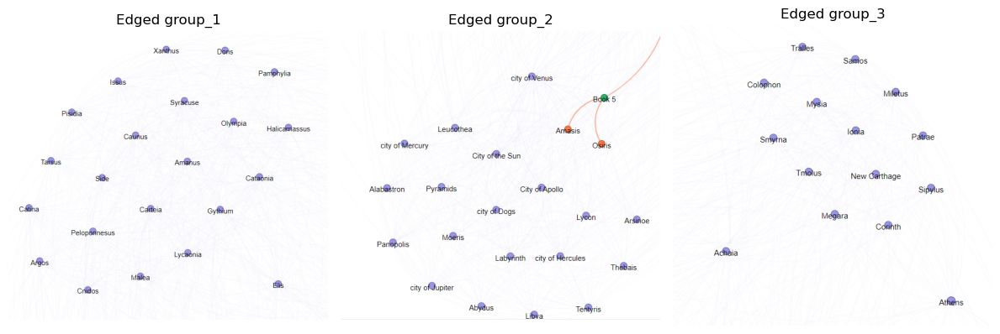

In [12]:
#| label: fig-nw_edged_groups
#| fig-cap: Example of edged groups in the network graph of India-related text in *Natural History*

from PIL import Image

# Open the images using PIL
image1 = Image.open('nw_zoom_distanced_group1.png')
image2 = Image.open('nw_zoom_distanced_group2.png')
image3 = Image.open('nw_zoom_distanced_group3.png')

# Create a 1x3 subplot grid
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image1)
plt.axis('off')  # Hide the axes
plt.title('Edged group_1')

plt.subplot(1, 3, 2)
plt.imshow(image2)
plt.axis('off')  # Hide the axes
plt.title('Edged group_2')

plt.subplot(1, 3, 3)
plt.imshow(image3)
plt.axis('off')  # Hide the axes
plt.title('Edged group_3')

# Adjust spacing between subplots
plt.tight_layout()

# Show the images in one row
plt.show()

Furthermore, three evident clusters of person names can be identified from the network graph, centred around book 6, book 7, and book 37. Refer to @fig-network_zoom_book6n7 (for Book 6 and Book 7) and @fig-network_zoom_book37 (for Book 37) for the zoomed-in captures.

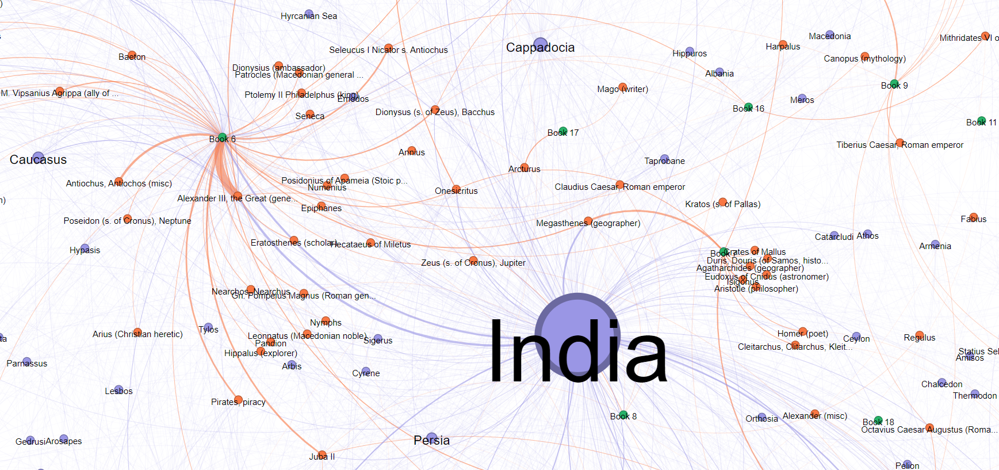

In [15]:
#| label: fig-network_zoom_book6n7
#| fig-cap: Clusters of Book 6 & Book 7 in India-related content in *Natural History* 

Image.open('nw_zoom_book6&7.png')

In the cluster of book 6, the most frequently mentioned historical figures are Alexander the Great and Dionysus (referred to as "Father Liber" at times), in relation to the tales and notes about the Roman Empire's conquests in the Indian subcontinent. The discourse also includes other significant figures such as "Juba II", "Ptolemy II Philadelphus", "Hippalus", "Patrocles", and "Leonnatus", who were governors, generals, and navigators. The cluster also depicts the frequent referenced scholars by Pliny in the India-related narratives, such as "Seneca", "Eratosthenes", and "Posidonius of Apameia".

In the cluster of book 7, where the discussion focused on anthropology, including human races, tribes, and human behaviors, a group of scholars are significantly referred to, including "Aristotle", "Eudoxus of Cnidus", "Duris", and "Agatharchides".

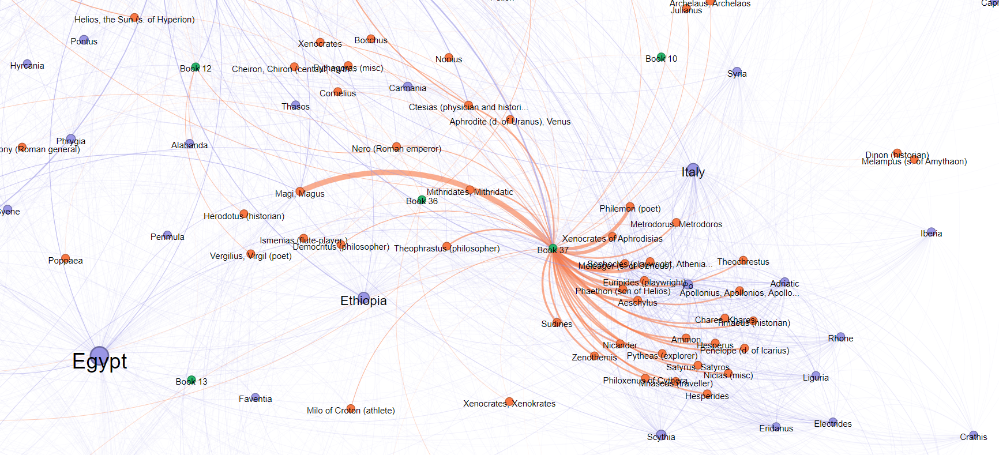

In [16]:
#| label: fig-network_zoom_book37
#| fig-cap: Clusters of Book 37 in India-related content in *Natural History* 

Image.open('nw_zoom_book37.png')

While in book 37, the cluster is heavily linked to renowned Greek scholars, including "Xenocrates", "Aeschylus", "Sudines" and "Zenothemis". Additionally, there is a considerable connection with the "Magi", referring to the priests of Zoroastrianism, a traditional Persian religion, which is mentioned in the discussion about tales and myths concerning the precious stones.

Upon closer examination, it is noteworthy that in book 37, Pliny directly refuted these two groups with a stern critical attitude. The Greek scholars and Magi are frequently cited as controversial subjects in book 37, serving as a strategy for Pliny to express his own worship of nature and the material world, as quoted in the subsequent paragraphs.

>37.11.2 "Here is an opportunity for **exposing the falsehoods of the Greeks**."

>37.14.1 "Now I shall discuss those kinds of gemstones that are acknowledged as such, beginning with the finest. And this shall not be my only aim, but to the greater profit of mankind **I shall incidentally confute the abominable falsehoods of the Magi**, since in very many of their statements about gems they have gone far beyond providing an alluring substitute for medical science into the realms of the supernatural."


In summary, the network graph illustrates the interconnectivity between various clustered entities and the central entities within the narrative. In this study, the correlation between the place names, person names, and book numbers in the target text shows that India is the focal point of the narrative, while Arabia is closely linked to this centre. Furthermore, the depiction of the person names of historical figures, mythical gods, explorers, and scholars in the narrative sheds light on the structure of India-related content in *Natural History*. 

The inclusion of additional entity types such as animals, events, and ethnic groups in the network will undoubtedly contribute to a more nuanced distance map and entity clustering, revealing more dimensions of the content structure.

\newpage

## Conclusions  {#sec-conclusions}

### Comprehension of "India" in the narrative

Guided by the research questions of "How is India described, and how is the information about India structured in the work?", the above analysis with different methods, including word frequency and collocation analysis, topic modelling, and network analysis, with an integration of close reading to the textual contet, comprise a comprehension of "India" in the narrative of *Natural History*.

In general, India is considered a significant geographical contrast to the Roman Empire and the Mediterranean. India is often mentioned for comparison in descriptions of landscapes, expeditions, navigation or trading routes, and origins of natural creatures and elements of other locations. The names of the rivers in the India, including some tributaries, are highlighted as references. India's role as a major trading partner is also significant in the narrative, as it frequently imports rare and precious treasures into the Mediterranean.

The content relating to India potentially themed in three topics which can be illustrated in more details by closely examining the text. The two dominant topics cover the geographical and social conditions of Indian nations as well as stones that are originated or produced in India. Within the topic about general introduction to India, other than addressing it as an origin of numerous marvels, Pliny also incidentally mentioned the epic tales and history related to the conquest of India, suggesting an imperial perspective of the work. And in the less prominent topic, which focused on merchandise trade, Pliny criticised human greed and the unnecessary interference with nature that it represents, which echoes his Stoic view of the relationship between nature and the human world.

A network of place names, personal names, and book numbers related to India has been created to illustrate the focus and co-occurrence clusters in the content structure. It shows that Arabia is the place that in closest proximity to India in the narrative. And there tend to be specific historical figures and referencing scholars clustering around different books. It is notable that Magi and Greek scholars played a significant role as disproving subjects in the person name cluster of book 37, which helped Pliny express his Stoic advocacy of worshipping the natural and material world.

In summary, in Pliny's unintentional portrait, India showed its complex figure as a geographical contrast, an origin of marvels and treasures, a major trading partner, and a context of unnecessary luxurious pursuit of Pliny's contemporary that he debated against in the scope of *Natural History*. 

### Distant reading as a method

The attempt of employing several distant reading methods for a research of classical text in this study has, to a certain extent, achieved a response to the research question. 

From identifying the research question to conducting analysis of the designated text, the distant reading methods have provided valuable insights and enriched information. However, as demonstrated in the topic modelling section of the data analysis, it is crucial to integrate close reading in interpreting the results obtained through distant reading.

Besides, comprehensive checks are essential to ensure the completeness and validity of data before proceeding with the analysis techniques mentioned. Converting complex textual content into structured data in a tabular format requires meticulous attention to detail, as any omissions or inaccuracies in the dataset can significantly impact subsequent outputs and their representation.

Another benefit of adopting the distant reading approaches is that the output dataset can be repurposed for further investigations. Together with this thesis, the following dataset and outputs are available on the [GitHub repository](https://github.com/lizaodawn/NH_thesis) for future use:

1. Dataset of Indian place names mentioned in *Natural Hisoty* with the corresponding textual passages (scraped from TOPOSText with supplemented mannual annotations)

2. Dataset of geographical names menttioned in *Natural History* with the corresponding textual passages (scraped from TOPOSText)

2. Corpus files containing textual passages relevant to India from *Natural History*

3. Network graph featuring connections among place names, person names, and book numbers pertaining to India-related content within *Natural History*

In addition, this thesis has been effectively presented by integrating [Quarto](https://quarto.org/) with [Jupyter](https://jupyter.org/) Notebook. A cohesive presentation across HTML and PDF formats has been achieved by embedding YAML metadata within the notebook. The HTML rendering makes it easy to distribute interactive maps and graphics on the web, providing a flexible approach to sharing research results.

### Reflection and limitation

Although considerable effort has been put into conducting a comprehensive study for this thesis, there are certain limitations within the data preprocessing and parameter tuning phases that could be improved.

During the data preparation phase, it was discovered that Indian place names sourced from TOPOSText were incomplete and required manual validation. As a result, about 24% of the original dataset was supplemented after validation. Although these additional annotations have been merged into the dataset containing all the place names, there may still be missing identifications of places outside the predefined coordinate range for India. However, manual validation and supplementation of such cases require a significant amount of time and effort, which was not feasible at the scale of this study. If possible, a similar supplementation process for all place names could improve the completeness of the dataset and promote greater contextual consistency for the study.

And for the topic modelling section, the parameter setting of topic number was determined through a validation process based on the coherence score comparison. Further fine-tuning of the model could be achieved through additional validation of parameters and broader comparisons. Adopting this comprehensive approach would improve the robustness of the topic modelling outcomes.

Due to time constraints, the network analysis only incorporated person names as an additional entity node. By encompassing more entity types, like animals, events, and ethnic groups, available through TOPOSText annotations, deeper insight into the content's structural dynamics could be gained by expanding this analysis. This remains to improve if the study continues to progress. Moreover, the presentation of the network graphs could be enhanced by exploring alternative platforms that offer greater interactivity. A preferable approach involves creating graphs that can be easily zoomed between various clusters and filtered based on different node types. This interactivity would improve the accessibility and usability of the graph's visualisation.

\newpage

## References
  
